In [1]:
# AeroCNN-II
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

import datetime
%matplotlib inline

In [38]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 100
strides1 = 1
strides2 = 2
lr=1e-03
batch_size=20

In [5]:
alpha = np.linspace(-10,20,16).reshape((16,1))

In [6]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [7]:
aa = aa.reshape((133, 16, 1, 1))

In [8]:
os.chdir('D:\\AeroCNN2Inputs')

In [9]:
origin = "D:\\AeroCNN2Inputs2"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_poisson = "D:\\CNN_poisson_files\\poisson\\bc2"

In [10]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [174]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data])

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [12]:
image_np = image_df.iloc[:, :].values

In [13]:
image = image_np.reshape((133, 16, n_grid, n_grid))

In [14]:
image = 1-image/100

In [15]:
# Laplace/Poisson field
field_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin_poisson + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        field_df = pd.concat([field_df, data], axis=0)

In [16]:
field_np = field_df.iloc[:, :].values

In [134]:
field_t = field_np.reshape((133, 16, n_grid, n_grid))

In [17]:
imr = SimpleImputer(missing_values=np.nan, strategy='mean')
imr = imr.fit(field_np)
imputed_field = imr.transform(field_np)

In [18]:
field = imputed_field.reshape((133, 16, n_grid, n_grid))

In [19]:
field_nor = (field-np.min(field))/(np.max(field)-np.min(field))

In [20]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 1].values

In [21]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [22]:
geometry.shape

(2128, 1)

In [23]:
geometry = geometry.reshape((133, 16, 1))

In [24]:
x_train, x_test, aa_train, aa_test, geo_train, geo_test, y_train, y_test = train_test_split(image, aa, geometry, field_nor, test_size=0.05, random_state=1)

In [25]:
x_train = x_train.reshape((x_train.shape[0]*x_train.shape[1], x_train.shape[2], x_train.shape[3], 1))
x_test = x_test.reshape((x_test.shape[0]*x_test.shape[1], x_test.shape[2], x_test.shape[3], 1))
aa_train = aa_train.reshape((aa_train.shape[0]*aa_train.shape[1], aa_train.shape[2], aa_train.shape[3]))
aa_test = aa_test.reshape((aa_test.shape[0]*aa_test.shape[1], aa_test.shape[2], aa_test.shape[3]))
geo_train = geo_train.reshape((geo_train.shape[0]*geo_train.shape[1], geo_train.shape[2]))
geo_test = geo_test.reshape((geo_test.shape[0]*geo_test.shape[1], geo_test.shape[2]))
y_train = y_train.reshape((y_train.shape[0]*y_train.shape[1], y_train.shape[2], y_train.shape[3], 1))
y_test = y_test.reshape((y_test.shape[0]*y_test.shape[1], y_test.shape[2], y_test.shape[3], 1))

In [30]:
tf.keras.backend.set_image_data_format('channels_last')

In [31]:
input_image = tf.keras.Input(shape=(n_grid, n_grid, 1))

x_conv = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer1')(input_image)
x_ = tf.keras.layers.MaxPooling2D((2,2))(x_conv)
x_conv = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer2')(x_)
x_ = tf.keras.layers.MaxPooling2D((2,2))(x_conv)

x_conv = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                         strides=(strides2,strides2),
                                         activation='relu', padding='same',
                                         kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                         name='Conv2DTLayer1')(x_)
x_conv = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                         strides=(strides2,strides2),
                                         activation='relu', padding='same',
                                         kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                         name='Conv2DTLayer2')(x_conv)

x_conv = tf.keras.layers.Conv2D(1, (1, 1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayerFinal')(x_conv)

output_data = tf.keras.layers.Reshape((n_grid,n_grid,1))(x_conv)

# AeroCNN-II/Poisson/BC 2
model = tf.keras.Model(input_image, output_data)

In [32]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 50, 50, 100)      0         
 )                                                               
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 Conv2DTLayer1 (Conv2DTransp  (None, 50, 50, 200)      360200

In [41]:
#with mirrored_strategy.scope():
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [42]:
#with mirrored_strategy.scope():
start = datetime.datetime.now()
history = model.fit(x_train, y_train, epochs=5000, shuffle=True, batch_size=batch_size,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100,
                                                                restore_best_weights=True,
                                                                verbose=1),
                               tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                                    mode='min', patience=20,
                                                                    min_delta=1e-06,
                                                                    min_lr=1e-06,
                                                                    verbose=1)])
end = datetime.datetime.now()

Epoch 1/5000
101/101 [==============================] - 4s 30ms/step - loss: 0.0455 - rmse: 0.2133
Epoch 2/5000
101/101 [==============================] - 3s 30ms/step - loss: 0.0086 - rmse: 0.0929
Epoch 3/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.0190e-04 - rmse: 0.0171
Epoch 4/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4955e-04 - rmse: 0.0155
Epoch 5/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.6025e-04 - rmse: 0.0122
Epoch 6/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.5400e-04 - rmse: 0.0120
Epoch 7/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.2843e-04 - rmse: 0.0108
Epoch 8/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.1203e-04 - rmse: 0.0101
Epoch 9/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.5503e-04 - rmse: 0.0120
Epoch 10/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.2

101/101 [==============================] - 3s 30ms/step - loss: 6.8325e-05 - rmse: 0.0076
Epoch 80/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0488e-05 - rmse: 0.0063
Epoch 81/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3956e-05 - rmse: 0.0066
Epoch 82/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.7987e-05 - rmse: 0.0069
Epoch 83/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.3869e-05 - rmse: 0.0058
Epoch 84/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.1179e-05 - rmse: 0.0071
Epoch 85/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.5314e-05 - rmse: 0.0059
Epoch 86/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.9255e-05 - rmse: 0.0054
Epoch 87/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.9533e-05 - rmse: 0.0089
Epoch 88/5000
101/101 [==============================] - 3s 30ms/step - loss: 

101/101 [==============================] - 3s 30ms/step - loss: 2.3285e-05 - rmse: 0.0037
Epoch 158/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4067e-05 - rmse: 0.0038
Epoch 159/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.0896e-05 - rmse: 0.0085
Epoch 160/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.2240e-05 - rmse: 0.0048
Epoch 161/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.0534e-05 - rmse: 0.0034
Epoch 162/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.1314e-05 - rmse: 0.0035
Epoch 163/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.9896e-05 - rmse: 0.0033
Epoch 164/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4213e-05 - rmse: 0.0039
Epoch 165/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.6611e-05 - rmse: 0.0042
Epoch 166/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 2.0317e-05 - rmse: 0.0035
Epoch 236/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.8451e-05 - rmse: 0.0032
Epoch 237/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.9484e-05 - rmse: 0.0034
Epoch 238/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.8229e-05 - rmse: 0.0032
Epoch 239/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.7558e-05 - rmse: 0.0044
Epoch 240/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.1409e-05 - rmse: 0.0036
Epoch 241/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.7808e-05 - rmse: 0.0044
Epoch 242/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4429e-05 - rmse: 0.0040
Epoch 243/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.7646e-05 - rmse: 0.0031
Epoch 244/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 1.3300e-05 - rmse: 0.0025
Epoch 314/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0843e-05 - rmse: 0.0019
Epoch 315/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0196e-05 - rmse: 0.0017
Epoch 316/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.3516e-05 - rmse: 0.0025
Epoch 317/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.1900e-05 - rmse: 0.0022
Epoch 318/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.2256e-05 - rmse: 0.0022
Epoch 319/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0970e-05 - rmse: 0.0019
Epoch 320/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.6099e-05 - rmse: 0.0030
Epoch 321/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.5506e-05 - rmse: 0.0043
Epoch 322/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 1.1803e-05 - rmse: 0.0023
Epoch 392/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0578e-05 - rmse: 0.0020
Epoch 393/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.6045e-06 - rmse: 0.0018
Epoch 394/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.2545e-05 - rmse: 0.0025
Epoch 395/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1537e-05 - rmse: 0.0023
Epoch 396/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.4956e-06 - rmse: 0.0018
Epoch 397/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.4521e-05 - rmse: 0.0029
Epoch 398/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.9004e-05 - rmse: 0.0048
Epoch 399/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.5165e-05 - rmse: 0.0030
Epoch 400/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 7.7992e-06 - rmse: 0.0015
Epoch 470/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.4952e-05 - rmse: 0.0030
Epoch 471/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.6272e-06 - rmse: 0.0014
Epoch 472/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.8378e-06 - rmse: 0.0015
Epoch 473/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.1501e-06 - rmse: 0.0016
Epoch 474/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.6731e-05 - rmse: 0.0033
Epoch 475/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.9135e-05 - rmse: 0.0037
Epoch 476/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.1708e-05 - rmse: 0.0025
Epoch 477/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.7711e-06 - rmse: 0.0018
Epoch 478/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 7.8589e-06 - rmse: 0.0017
Epoch 548/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.4737e-06 - rmse: 0.0021
Epoch 549/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.9017e-06 - rmse: 0.0014
Epoch 550/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.5343e-06 - rmse: 0.0016
Epoch 551/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.6596e-06 - rmse: 0.0019
Epoch 552/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.2291e-06 - rmse: 0.0018
Epoch 553/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.2081e-05 - rmse: 0.0027
Epoch 554/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0921e-05 - rmse: 0.0024
Epoch 555/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.5044e-05 - rmse: 0.0032
Epoch 556/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 1.2031e-05 - rmse: 0.0028
Epoch 626/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.1611e-06 - rmse: 0.0013
Epoch 627/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.8392e-06 - rmse: 0.0015
Epoch 628/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.6176e-06 - rmse: 0.0015
Epoch 629/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8949e-06 - rmse: 0.0012
Epoch 630/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.7807e-06 - rmse: 0.0015
Epoch 631/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.4653e-05 - rmse: 0.0032
Epoch 632/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.3711e-05 - rmse: 0.0030
Epoch 633/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.8292e-06 - rmse: 0.0021
Epoch 634/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 6.8483e-06 - rmse: 0.0017
Epoch 704/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.8591e-06 - rmse: 0.0017
Epoch 705/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.7849e-06 - rmse: 0.0013
Epoch 706/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.1212e-06 - rmse: 0.0011
Epoch 707/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.7559e-05 - rmse: 0.0037
Epoch 708/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.8154e-06 - rmse: 0.0020
Epoch 709/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.1047e-06 - rmse: 0.0011
Epoch 710/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.5510e-06 - rmse: 0.0019
Epoch 711/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.3438e-05 - rmse: 0.0031
Epoch 712/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 1.0444e-05 - rmse: 0.0026
Epoch 782/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8421e-06 - rmse: 0.0015
Epoch 783/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.0812e-06 - rmse: 0.0012
Epoch 784/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.6315e-06 - rmse: 0.0025
Epoch 785/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.4173e-05 - rmse: 0.0033
Epoch 786/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.0717e-06 - rmse: 0.0021
Epoch 787/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.1597e-06 - rmse: 0.0013
Epoch 788/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.5408e-06 - rmse: 0.0014
Epoch 789/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.9714e-06 - rmse: 0.0019
Epoch 790/5000
101/101 [==============================] - 3s 30ms/step

101/101 [==============================] - 3s 30ms/step - loss: 2.2746e-05 - rmse: 0.0044
Epoch 860/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.9920e-06 - rmse: 0.0017
Epoch 861/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.6015e-06 - rmse: 0.0016
Epoch 862/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.9545e-06 - rmse: 8.8141e-04
Epoch 863/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.1414e-06 - rmse: 9.8432e-04
Epoch 864/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3273e-06 - rmse: 0.0015
Epoch 865/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.8235e-06 - rmse: 0.0013
Epoch 866/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.0969e-06 - rmse: 0.0014
Epoch 867/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.9488e-06 - rmse: 0.0017
Epoch 868/5000
101/101 [==============================] - 3s 3

101/101 [==============================] - 3s 30ms/step - loss: 3.4085e-06 - rmse: 7.2399e-04
Epoch 937/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.4764e-06 - rmse: 7.7242e-04
Epoch 938/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.5671e-06 - rmse: 8.3188e-04
Epoch 939/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.5136e-06 - rmse: 8.0189e-04
Epoch 940/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2280e-06 - rmse: 0.0018
Epoch 941/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.6260e-06 - rmse: 0.0013
Epoch 942/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.8104e-06 - rmse: 0.0014
Epoch 943/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.2949e-06 - rmse: 0.0021
Epoch 944/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.2709e-06 - rmse: 0.0021
Epoch 945/5000
101/101 [==============================

101/101 [==============================] - 3s 30ms/step - loss: 3.9362e-06 - rmse: 0.0011
Epoch 1014/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.2491e-06 - rmse: 7.9630e-04
Epoch 1015/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.6570e-06 - rmse: 0.0010
Epoch 1016/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.4550e-06 - rmse: 9.2075e-04
Epoch 1017/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.1734e-06 - rmse: 7.5514e-04
Epoch 1018/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.0173e-06 - rmse: 0.0012
Epoch 1019/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.6232e-06 - rmse: 0.0014
Epoch 1020/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.4305e-06 - rmse: 0.0014
Epoch 1021/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.6074e-06 - rmse: 0.0017
Epoch 1022/5000
101/101 [=========================

Epoch 1090/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.7874e-06 - rmse: 0.0016
Epoch 1091/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.9607e-06 - rmse: 0.0016
Epoch 1092/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.7221e-06 - rmse: 0.0015
Epoch 1093/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.3495e-06 - rmse: 9.9198e-04
Epoch 1094/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3010e-06 - rmse: 0.0017
Epoch 1095/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4352e-05 - rmse: 0.0047
Epoch 1096/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3198e-06 - rmse: 0.0017
Epoch 1097/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.7940e-06 - rmse: 0.0012
Epoch 1098/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.8011e-06 - rmse: 0.0012
Epoch 1099/5000
101/101 [=================

101/101 [==============================] - 3s 30ms/step - loss: 6.1983e-06 - rmse: 0.0020
Epoch 1167/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.0045e-06 - rmse: 9.0994e-04
Epoch 1168/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.6227e-06 - rmse: 6.7036e-04
Epoch 1169/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.6198e-06 - rmse: 6.7052e-04
Epoch 1170/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.7370e-06 - rmse: 7.5498e-04
Epoch 1171/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.3738e-06 - rmse: 0.0011
Epoch 1172/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.1444e-06 - rmse: 9.9173e-04
Epoch 1173/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.1285e-06 - rmse: 0.0026
Epoch 1174/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.9659e-06 - rmse: 0.0017
Epoch 1175/5000
101/101 [=================

101/101 [==============================] - 3s 30ms/step - loss: 2.7121e-06 - rmse: 8.4307e-04
Epoch 1243/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.0606e-06 - rmse: 0.0014
Epoch 1244/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.6037e-06 - rmse: 0.0013
Epoch 1245/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.9056e-06 - rmse: 0.0017
Epoch 1246/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.4128e-06 - rmse: 0.0016
Epoch 1247/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.6749e-06 - rmse: 0.0019
Epoch 1248/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.1267e-06 - rmse: 0.0020
Epoch 1249/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.4853e-06 - rmse: 0.0016
Epoch 1250/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.9519e-06 - rmse: 9.8429e-04
Epoch 1251/5000
101/101 [=============================

101/101 [==============================] - 3s 30ms/step - loss: 5.2801e-06 - rmse: 0.0019
Epoch 1319/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.4798e-06 - rmse: 0.0028
Epoch 1320/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.2929e-06 - rmse: 0.0016
Epoch 1321/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.4292e-06 - rmse: 0.0016
Epoch 1322/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.6574e-06 - rmse: 9.0682e-04
Epoch 1323/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.7268e-06 - rmse: 0.0017
Epoch 1324/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.9496e-06 - rmse: 0.0015
Epoch 1325/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.0798e-06 - rmse: 0.0015
Epoch 1326/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.9476e-06 - rmse: 0.0011
Epoch 1327/5000
101/101 [==============================] -

101/101 [==============================] - 3s 30ms/step - loss: 6.5949e-06 - rmse: 0.0022
Epoch 1395/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.4658e-06 - rmse: 0.0022
Epoch 1396/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.8140e-06 - rmse: 0.0015
Epoch 1397/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.9818e-06 - rmse: 0.0015
Epoch 1398/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4200e-06 - rmse: 0.0028
Epoch 1399/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.3437e-06 - rmse: 0.0013
Epoch 1400/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.3741e-06 - rmse: 8.2213e-04
Epoch 1401/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.5208e-06 - rmse: 9.0826e-04
Epoch 1402/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.5580e-06 - rmse: 9.2978e-04
Epoch 1403/5000
101/101 [=========================

101/101 [==============================] - 3s 30ms/step - loss: 2.1908e-06 - rmse: 7.6773e-04
Epoch 1471/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.1227e-06 - rmse: 7.2343e-04
Epoch 1472/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.9491e-06 - rmse: 5.9310e-04
Epoch 1473/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.2654e-06 - rmse: 8.1867e-04
Epoch 1474/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.6699e-06 - rmse: 0.0014
Epoch 1475/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2984e-06 - rmse: 0.0022
Epoch 1476/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.2720e-06 - rmse: 0.0016
Epoch 1477/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4579e-06 - rmse: 9.3205e-04
Epoch 1478/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.9446e-06 - rmse: 0.0012
Epoch 1479/5000
101/101 [=================

101/101 [==============================] - 3s 30ms/step - loss: 3.4160e-06 - rmse: 0.0014
Epoch 1547/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.0369e-06 - rmse: 0.0016
Epoch 1548/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.8847e-06 - rmse: 0.0015
Epoch 1549/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0058e-05 - rmse: 0.0029
Epoch 1550/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.2073e-06 - rmse: 0.0013
Epoch 1551/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.3222e-06 - rmse: 9.1538e-04
Epoch 1552/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.9482e-06 - rmse: 0.0012
Epoch 1553/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.8633e-06 - rmse: 0.0018
Epoch 1554/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0202e-05 - rmse: 0.0030
Epoch 1555/5000
101/101 [==============================] -

101/101 [==============================] - 3s 29ms/step - loss: 2.7986e-06 - rmse: 0.0012
Epoch 1623/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0215e-06 - rmse: 7.9096e-04
Epoch 1624/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.3157e-06 - rmse: 0.0017
Epoch 1625/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.7910e-06 - rmse: 0.0021
Epoch 1626/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.8717e-06 - rmse: 0.0023
Epoch 1627/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.7497e-06 - rmse: 0.0015
Epoch 1628/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2728e-06 - rmse: 9.3856e-04
Epoch 1629/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1786e-06 - rmse: 8.8782e-04
Epoch 1630/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.8205e-06 - rmse: 0.0012
Epoch 1631/5000
101/101 [=========================

101/101 [==============================] - 3s 29ms/step - loss: 2.2439e-06 - rmse: 9.6576e-04
Epoch 1699/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0056e-06 - rmse: 8.3417e-04
Epoch 1700/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.5241e-06 - rmse: 0.0011
Epoch 1701/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.4088e-06 - rmse: 0.0023
Epoch 1702/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0513e-05 - rmse: 0.0030
Epoch 1703/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.2066e-06 - rmse: 0.0014
Epoch 1704/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.7312e-06 - rmse: 0.0012
Epoch 1705/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.4116e-06 - rmse: 0.0011
Epoch 1706/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.7402e-06 - rmse: 6.5899e-04
Epoch 1707/5000
101/101 [=========================

101/101 [==============================] - 3s 29ms/step - loss: 1.8748e-06 - rmse: 7.9896e-04
Epoch 1775/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1555e-06 - rmse: 9.5938e-04
Epoch 1776/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.4949e-06 - rmse: 0.0015
Epoch 1777/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.2912e-06 - rmse: 0.0014
Epoch 1778/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.3127e-06 - rmse: 0.0014
Epoch 1779/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.6262e-06 - rmse: 0.0015
Epoch 1780/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8035e-06 - rmse: 0.0019
Epoch 1781/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.6204e-06 - rmse: 0.0015
Epoch 1782/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.0094e-06 - rmse: 0.0013
Epoch 1783/5000
101/101 [=============================

In [43]:
time = end - start
print("Training time:", time)

Training time: 1:30:08.303449


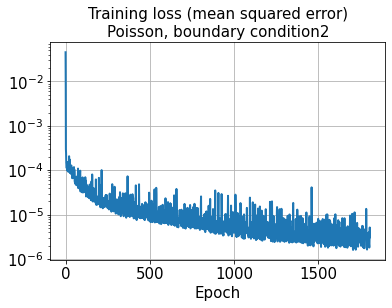

In [44]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.title('Training loss (mean squared error)\nPoisson, boundary condition2, test size 0.05', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

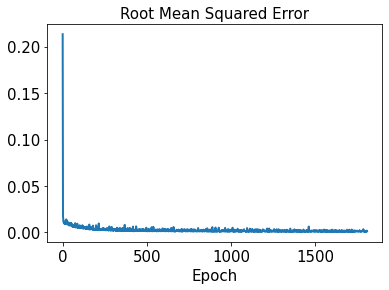

In [45]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

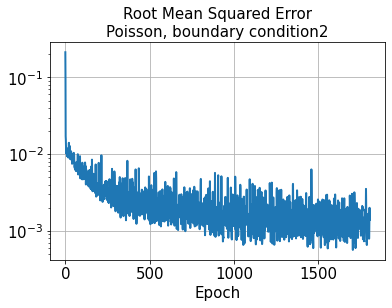

In [46]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error\nPoisson, boundary condition2, test size 0.05', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

In [47]:
#with mirrored_strategy.scope():
test_results = model.evaluate(x_train)

63/63 [==============================] - 1s 8ms/step - loss: 1.2114e-06 - rmse: 0.0000e+00


In [48]:
#with mirrored_strategy.scope():
decoded_train = model.predict(x_train)

63/63 [==============================] - 1s 10ms/step


In [49]:
#with mirrored_strategy.scope():
decoded_test = model.predict(x_test)

4/4 [==============================] - 0s 10ms/step


In [50]:
error_train_abs = np.abs(decoded_train - y_train)

In [51]:
error_test_abs = np.abs(decoded_test - y_test)

In [52]:
error_train_Cl_abs = np.abs(decoded_train[:,0,:] - y_train[:,0,:])

In [53]:
error_train_Cd_abs = np.abs(decoded_train[:,1,:] - y_train[:,1,:])

In [54]:
error_test_Cl_abs = np.abs(decoded_test[:,0,:] - y_test[:,0,:])

In [55]:
error_test_Cd_abs = np.abs(decoded_test[:,1,:] - y_test[:,1,:])

In [56]:
os.chdir("D:\\TrainedModels\\20221029")
model.save('Poisson_bc2_100kernel_2by2MaxPooling_2CNNlayer_testSize0.05.h5',
           overwrite=True, include_optimizer=True, save_format='h5')

In [57]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0010211926589284753


In [58]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.004988380955164884


In [59]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)
print(l2_error_train_list)

[0.0009518630924117481, 0.0006629260226927623, 0.0005438999357666993, 0.0011836668559254942, 0.0008016692575452615, 0.001652430593197358, 0.0009885473651173302, 0.00046462271296747996, 0.0006695498110305758, 0.0007118099987861845, 0.00086150274622334, 0.001187068327175693, 0.0015318248026039087, 0.0018524920112385583, 0.0015507713303452432, 0.002394140567780259, 0.0005765749246651867, 0.0010843603142486893, 0.0007205725074278406, 0.0005639249928526776, 0.0006256679330255001, 0.0010199396261826327, 0.0005204067897245809, 0.00040572227918647604, 0.0020652952951998515, 0.0011320320043481029, 0.0006556597445402726, 0.0005616739808630666, 0.0006765057443524831, 0.0008064407910407412, 0.00104990669234628, 0.002234118697954788, 0.0011971842744466594, 0.0006394672239143931, 0.0013907393086114441, 0.001236188095909435, 0.0009086143994349726, 0.0007805761258777432, 0.0012852510115535412, 0.0011039778692666631, 0.0008709701199835017, 0.0006605046597621954, 0.0009499997945508099, 0.001366532038493

In [60]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)
print(l2_error_test_list)

[0.0006221689006037099, 0.0006709902398007895, 0.00043410835452952325, 0.0005306991444702763, 0.0007255177979562706, 0.0018906252021468964, 0.0007131089124075921, 0.0005954921700347526, 0.001282887322342722, 0.0006288327852848142, 0.0009315519465486949, 0.0008104461965014989, 0.0019848744600575096, 0.001586767689805457, 0.0010473003602466508, 0.002717209918468412, 0.0008646276533238134, 0.0026505023993368885, 0.0004911137299256144, 0.001037650482465001, 0.0027434865280668666, 0.003399076598744673, 0.0030090251336135423, 0.005826739624673676, 0.003402818688856999, 0.003402783337425534, 0.004494435239660482, 0.00422482950086097, 0.004700377626377492, 0.005628250179941493, 0.0021202034832248956, 0.0021489938918342645, 0.0014904361866126619, 0.0006134549907770422, 0.0020162699749142463, 0.0011628831253840317, 0.0008689206002096092, 0.0016522773358721653, 0.0008258197535373283, 0.0011129850309385373, 0.001909312798547636, 0.0006375984589942631, 0.0010716893072596648, 0.0007768209984162528, 

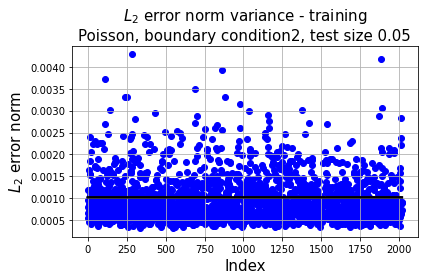

In [203]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - training\nPoisson, boundary condition2, test size 0.05', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

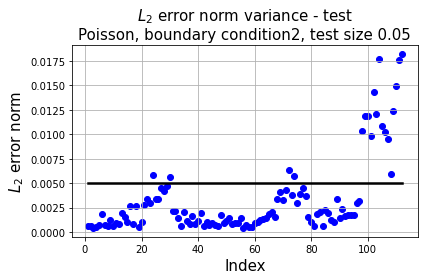

In [204]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - test\nPoisson, boundary condition2, test size 0.05', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

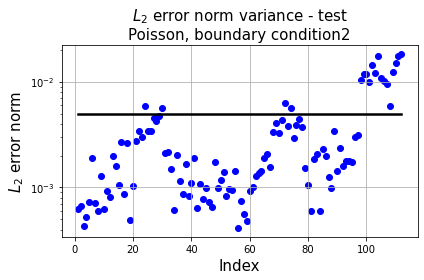

In [63]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - test\nPoisson, boundary condition2, test size 0.05', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

In [205]:
os.chdir("D:\\CNN_poisson_files\\images\\20221029\\testSize0.05")

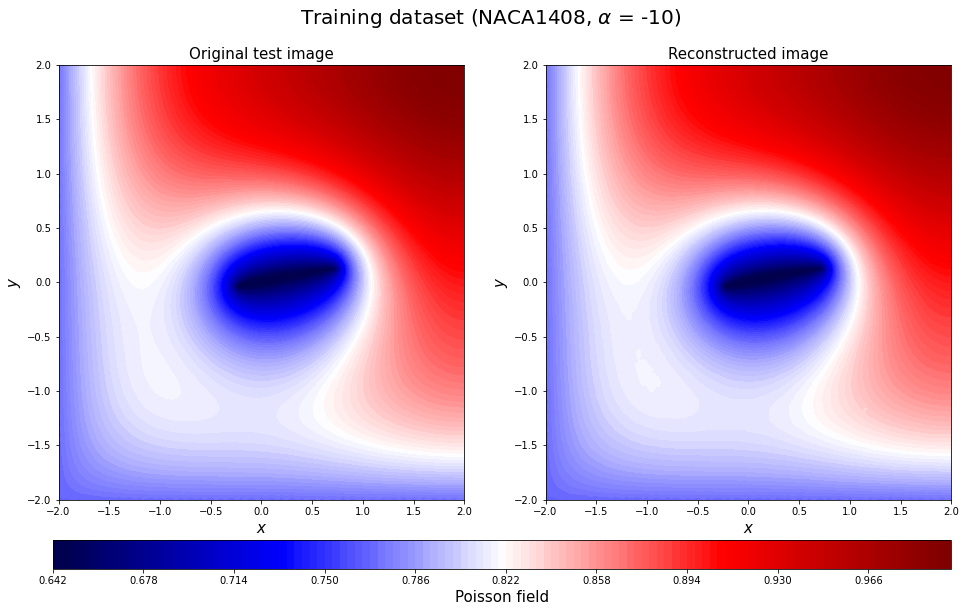

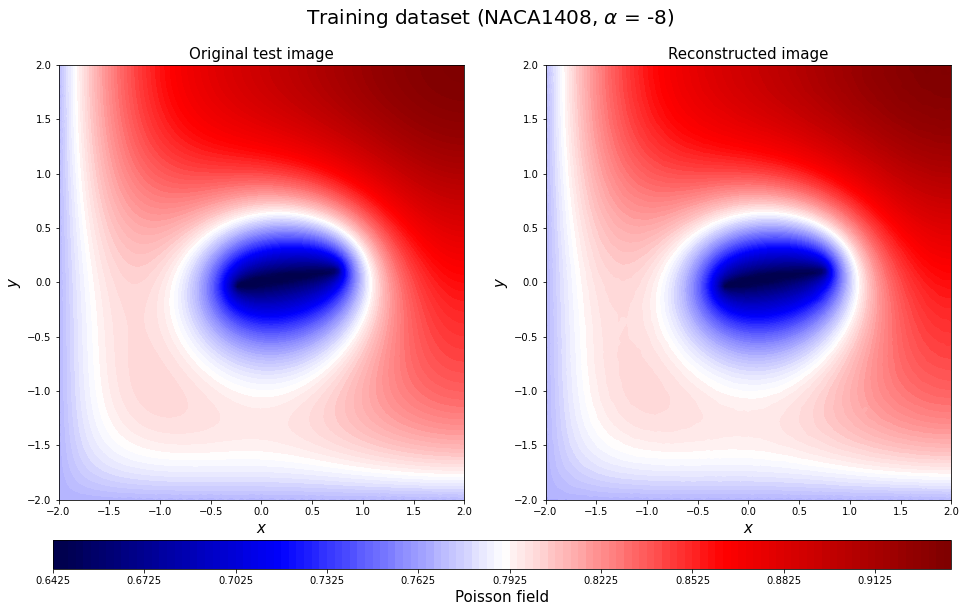

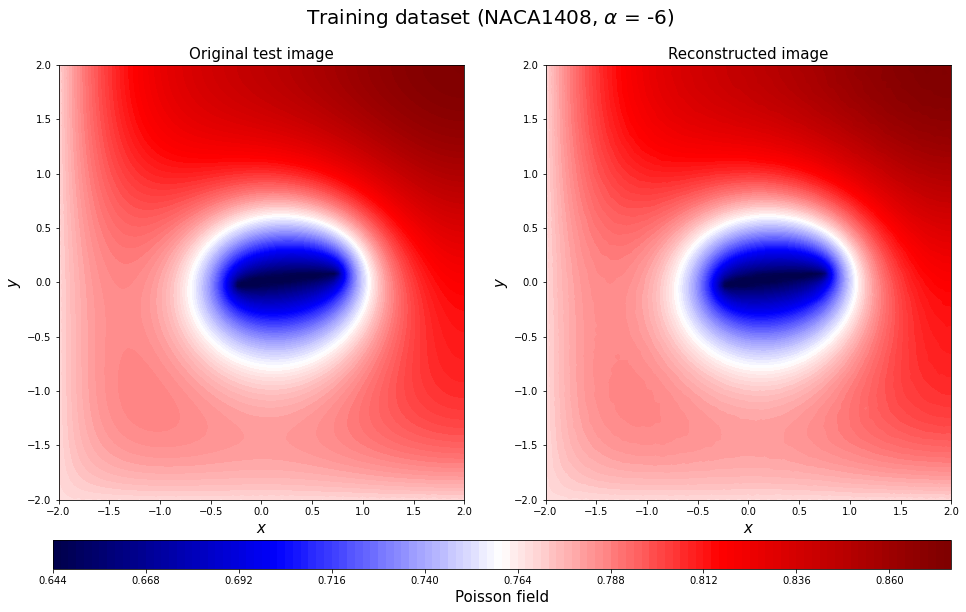

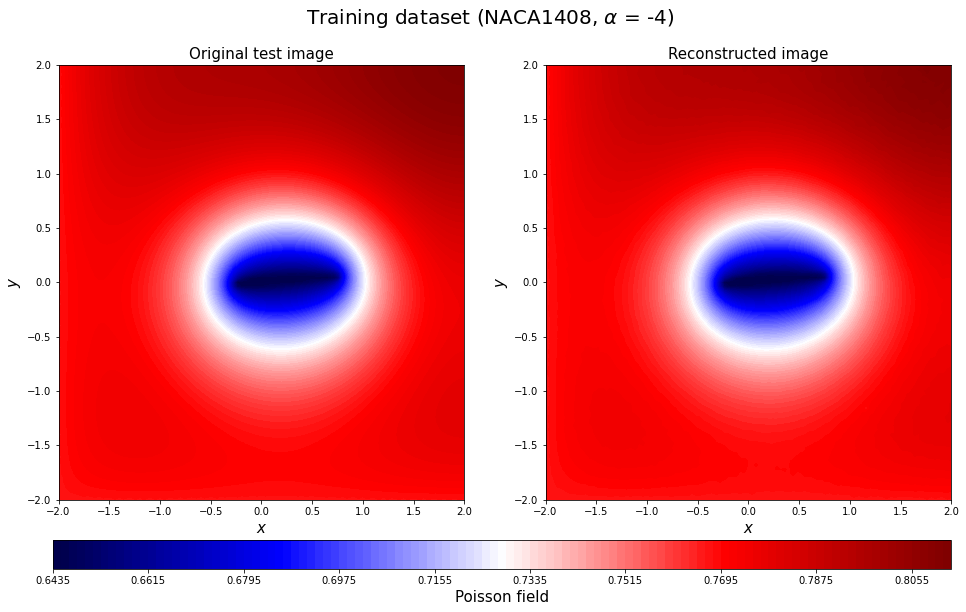

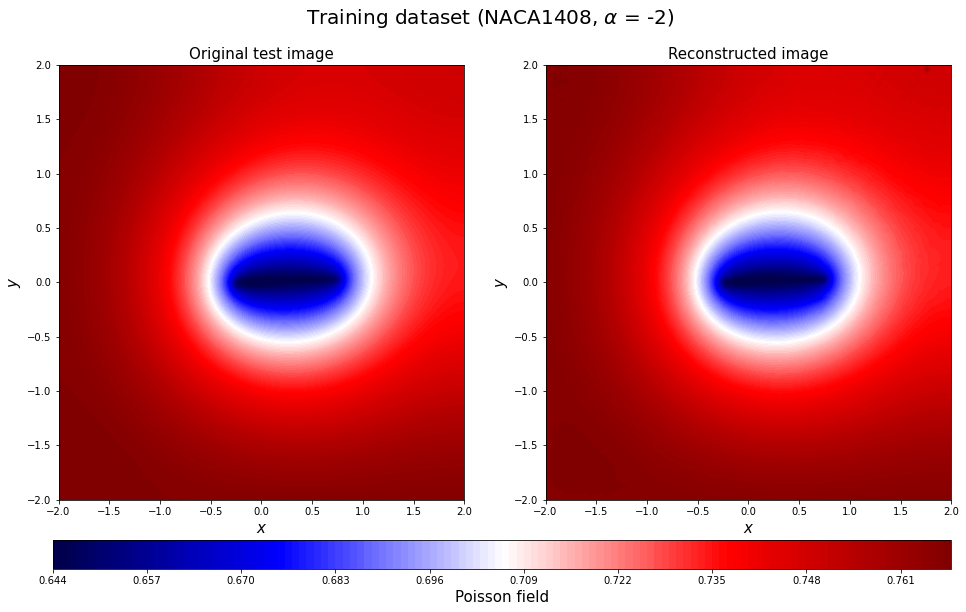

...

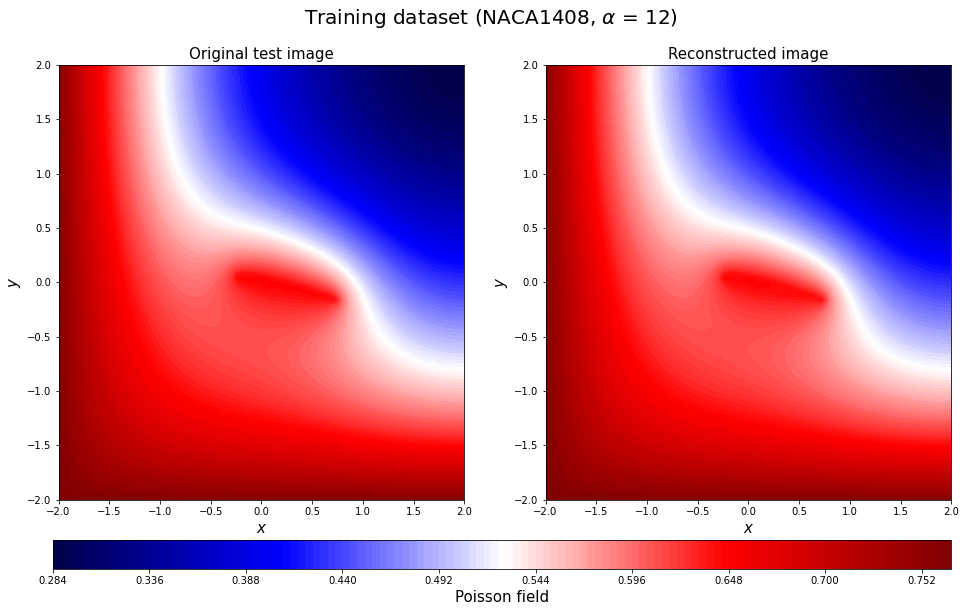

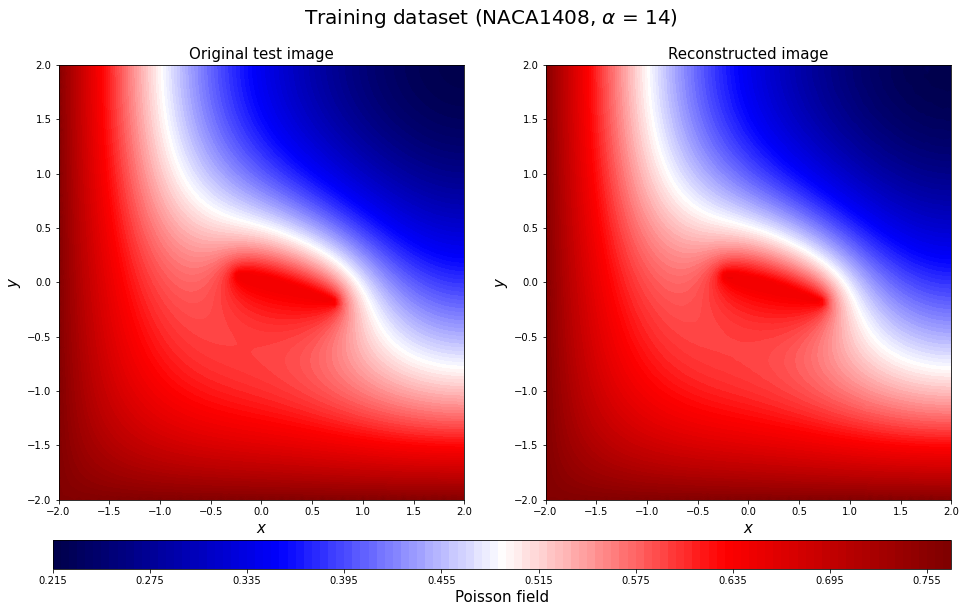

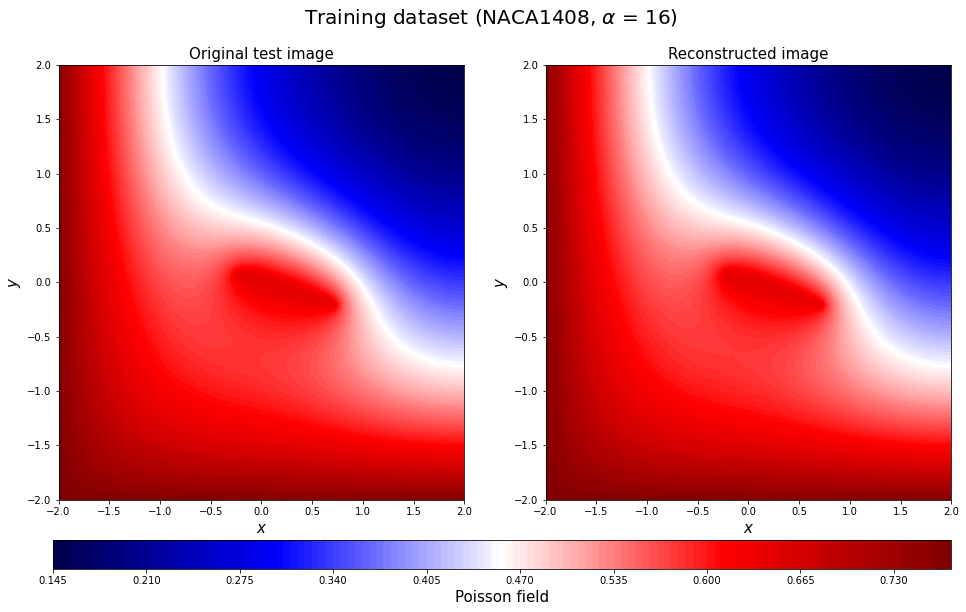

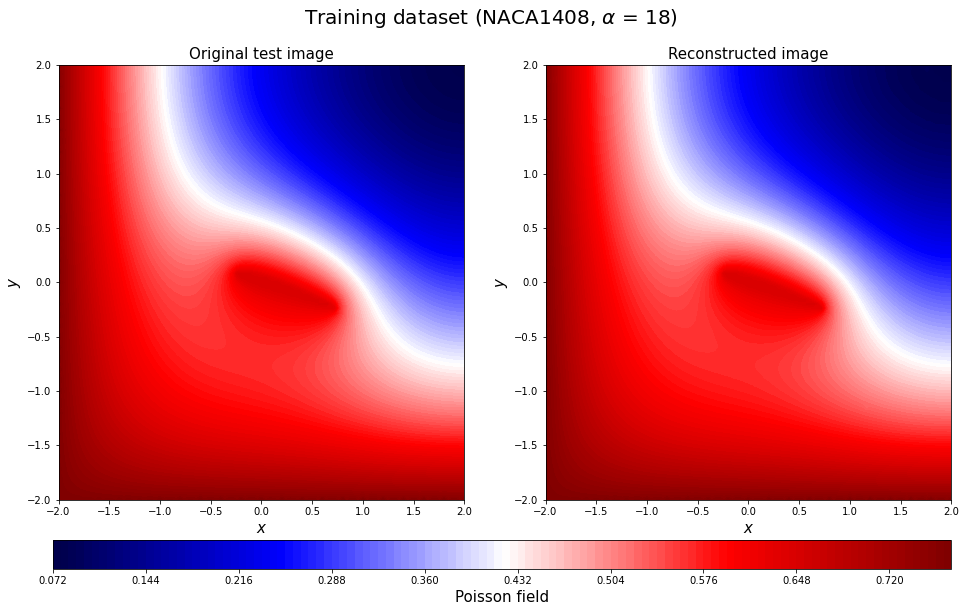

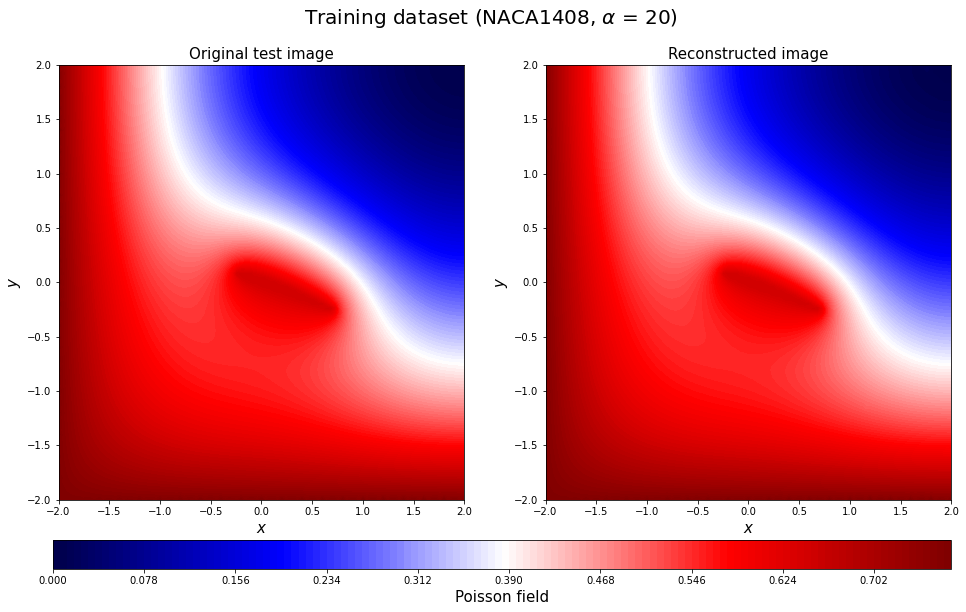

In [208]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate, vmin=np.min(y_train0_rotate),
                      vmax = np.max(y_train0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_train0_rotate),
                      vmax = np.max(y_train0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221029Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

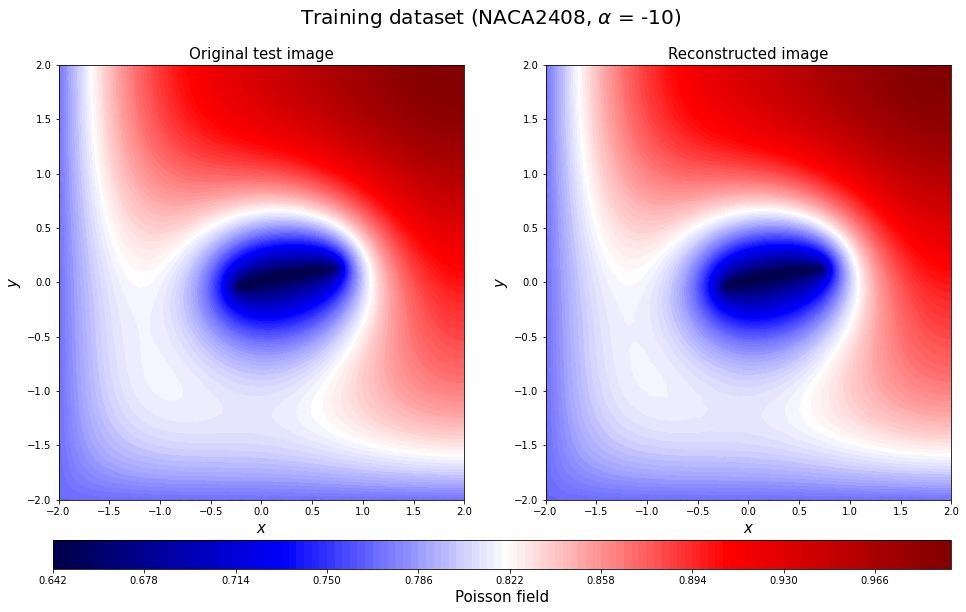

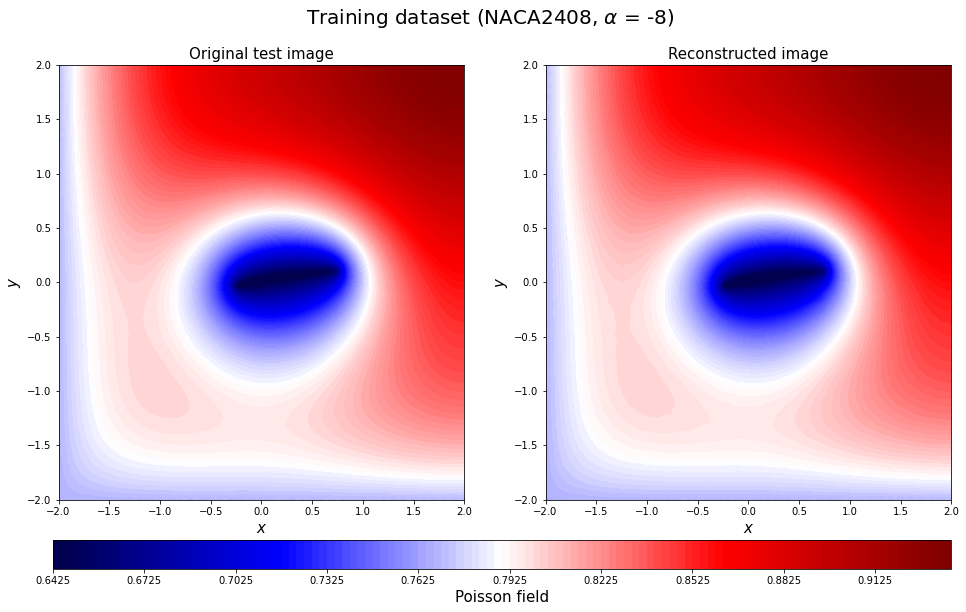

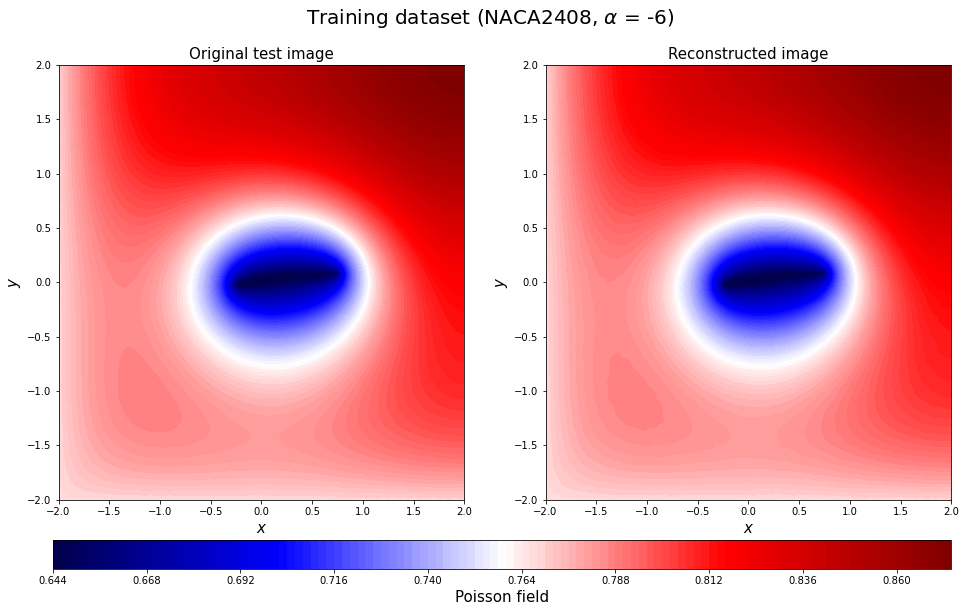

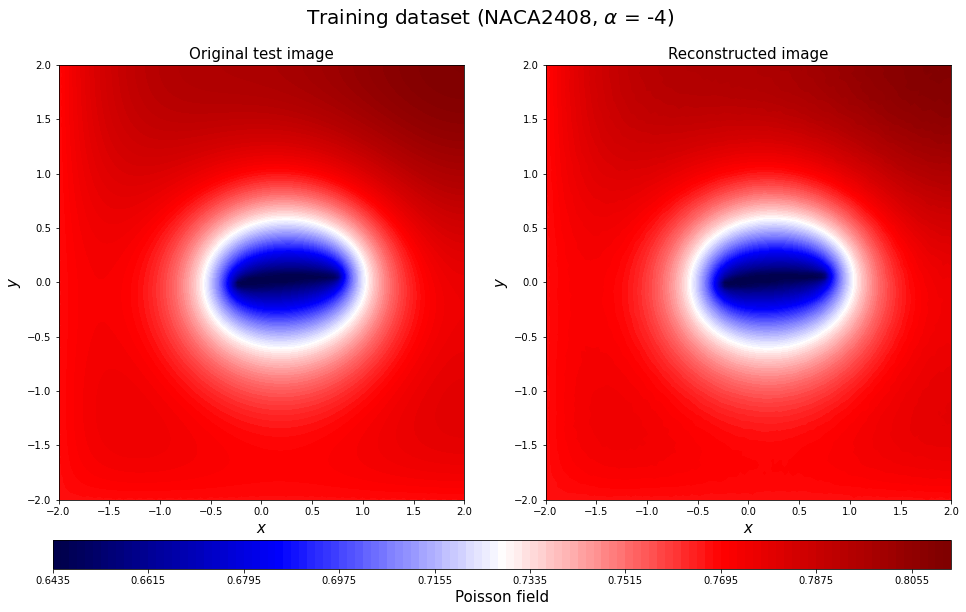

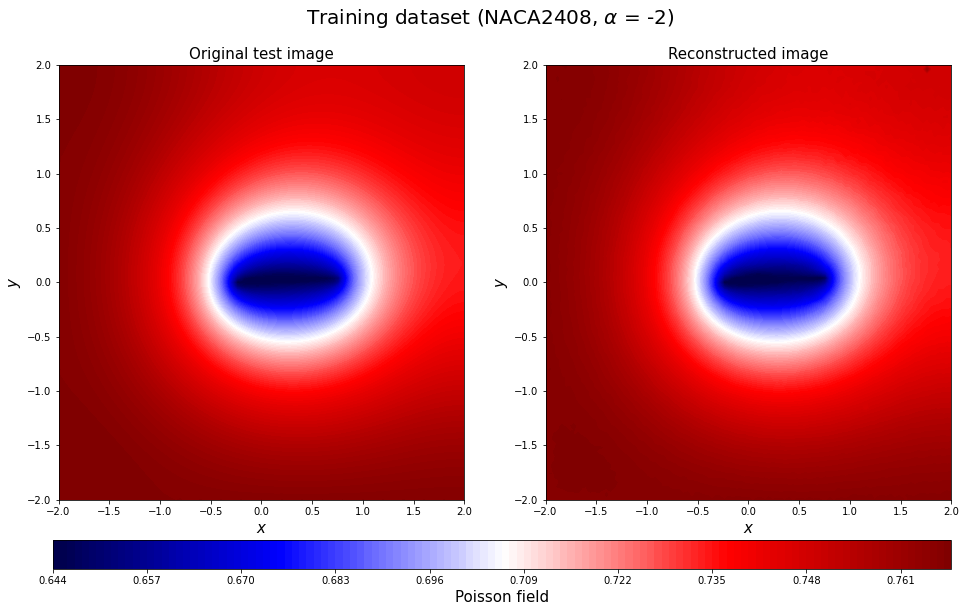

...

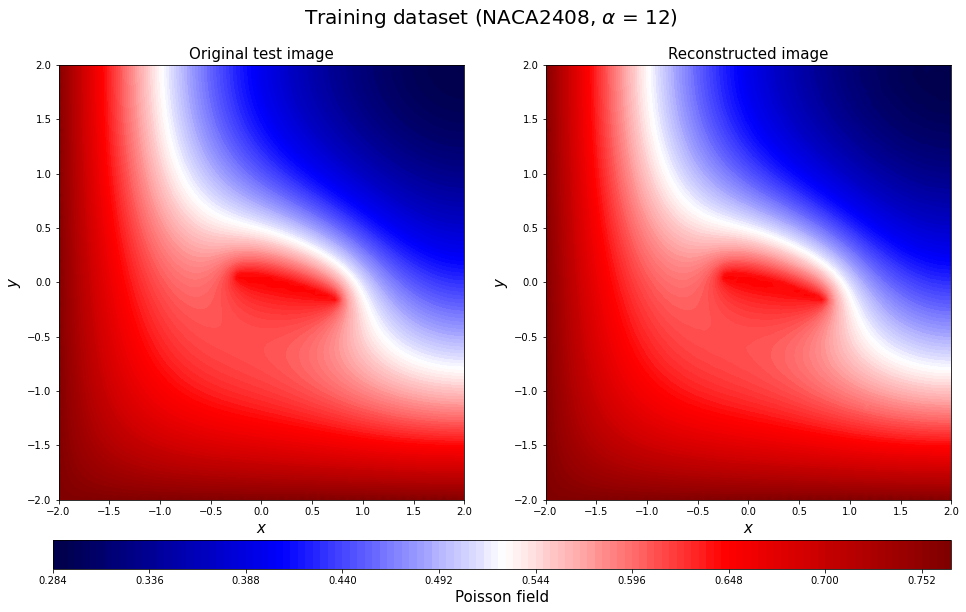

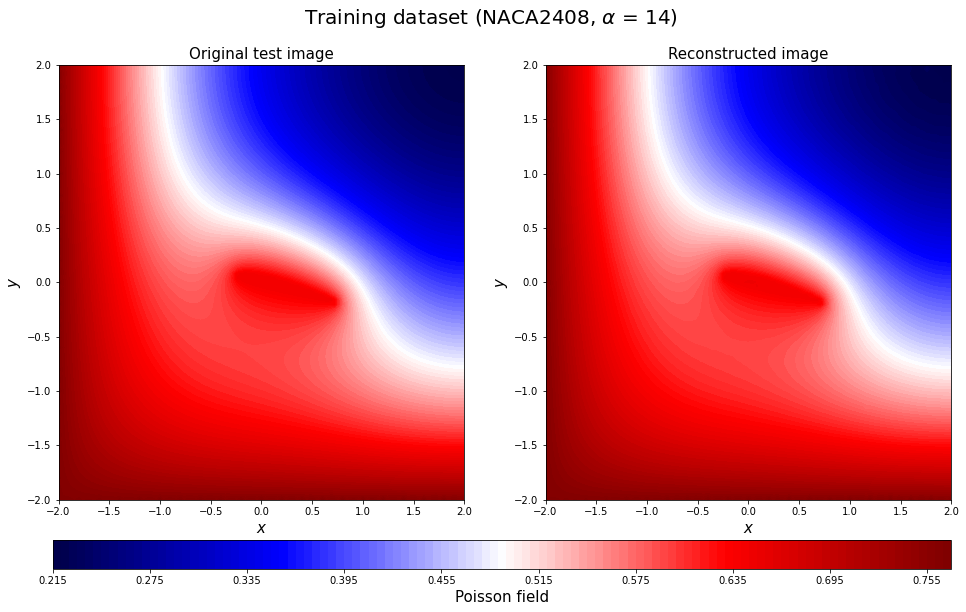

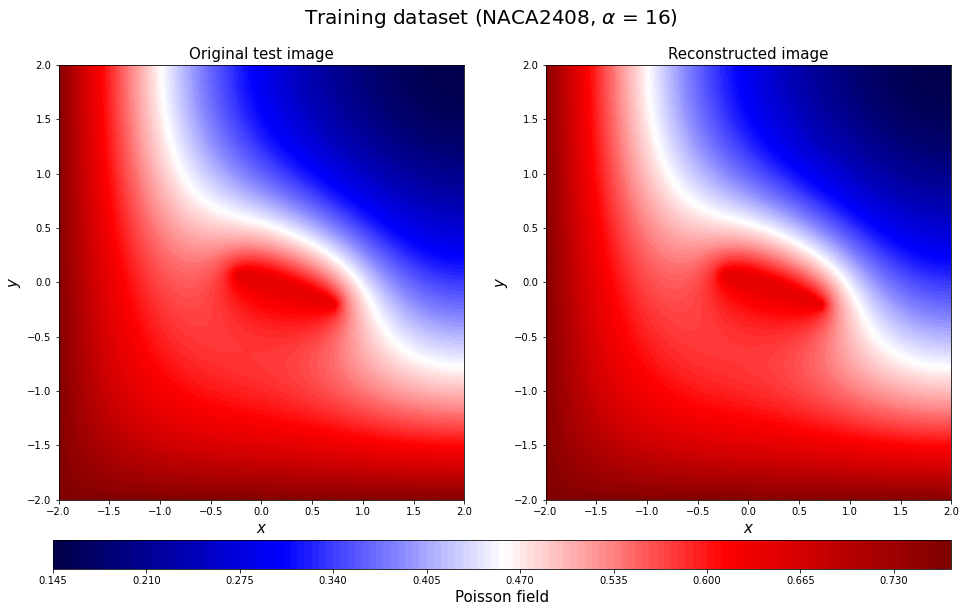

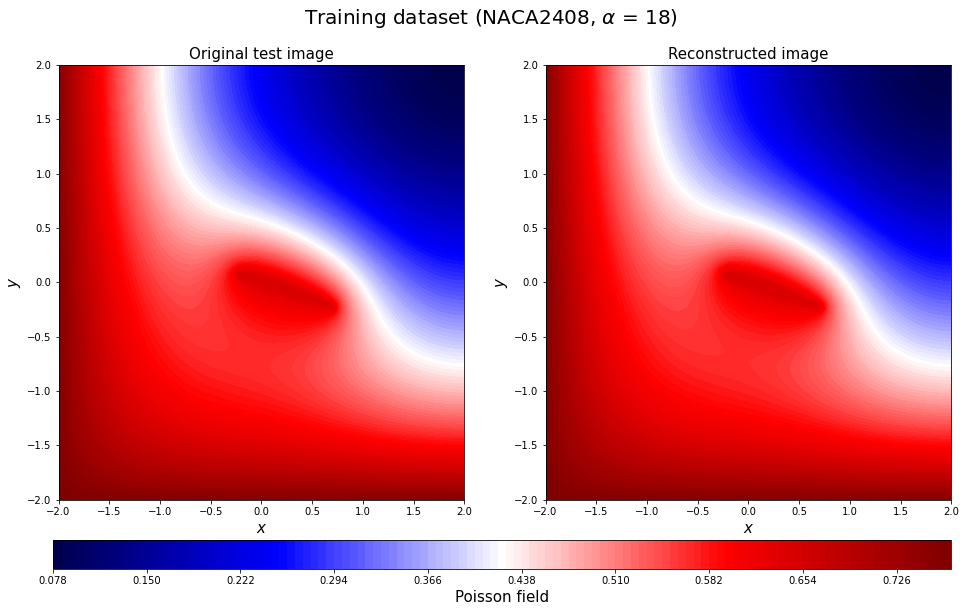

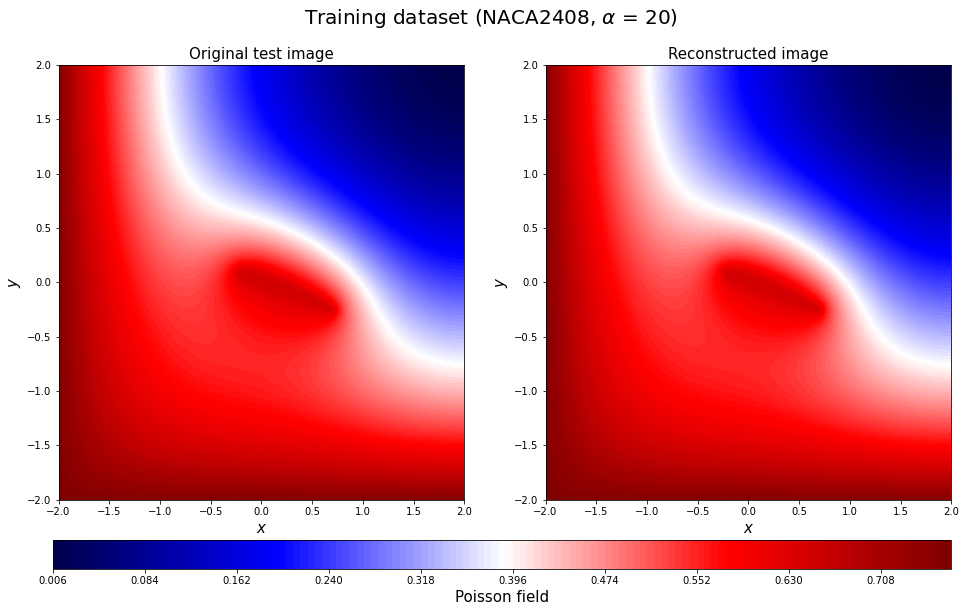

In [210]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, vmin=np.min(y_train20_rotate),
                      vmax=np.max(y_train20_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_train20_rotate),
                      vmax=np.max(y_train20_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221029Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

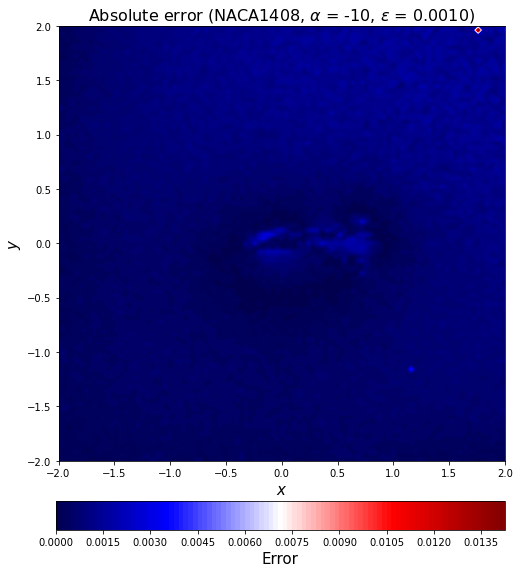

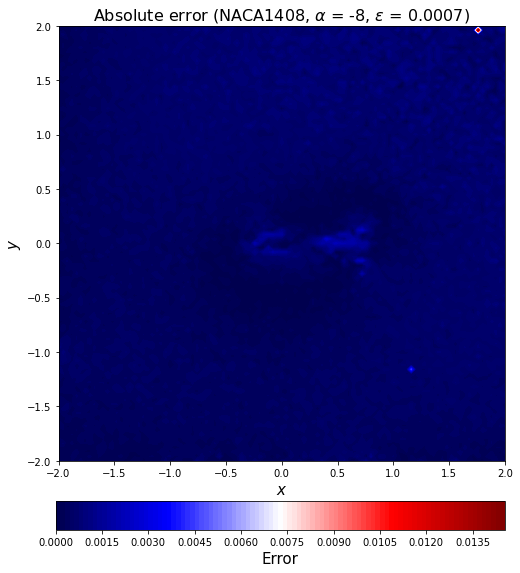

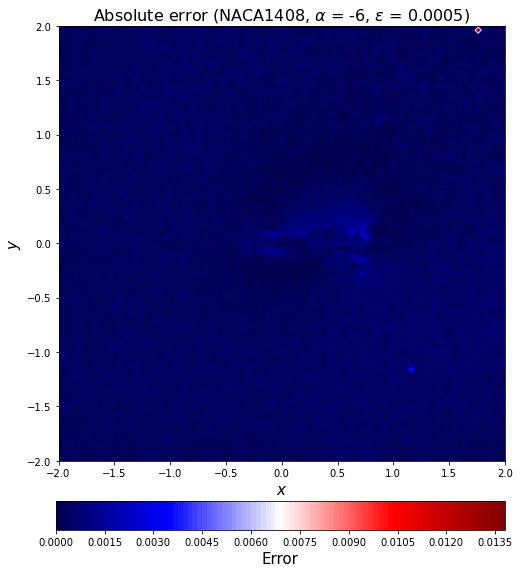

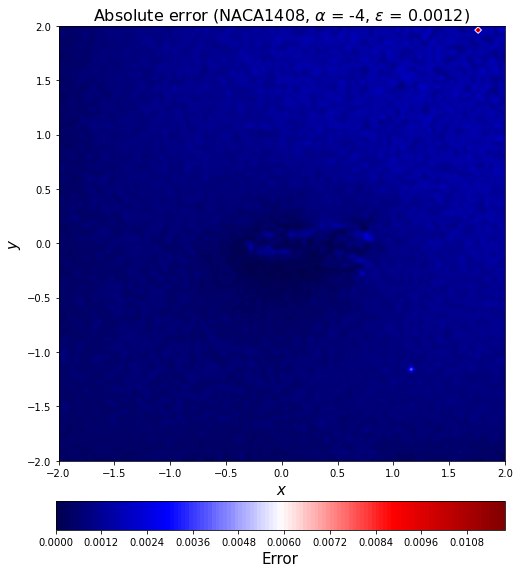

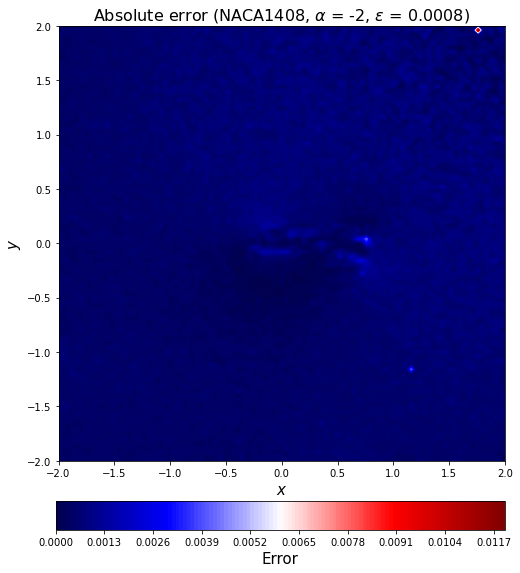

...

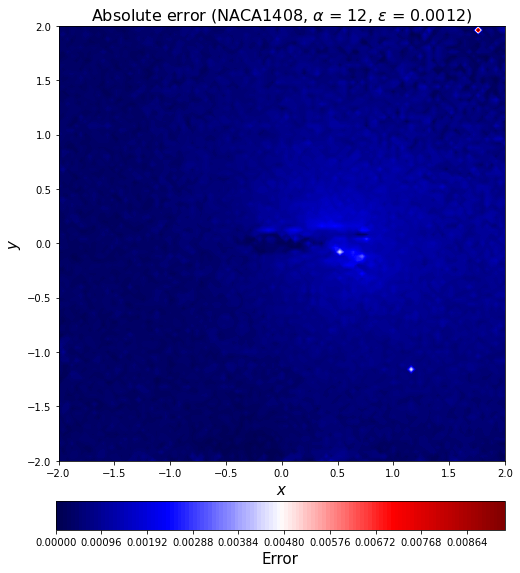

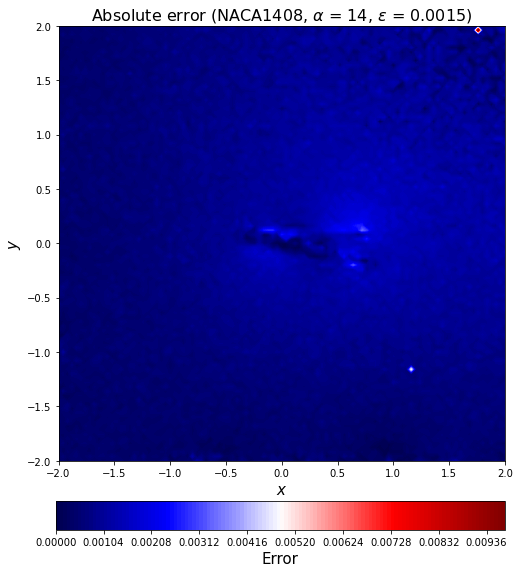

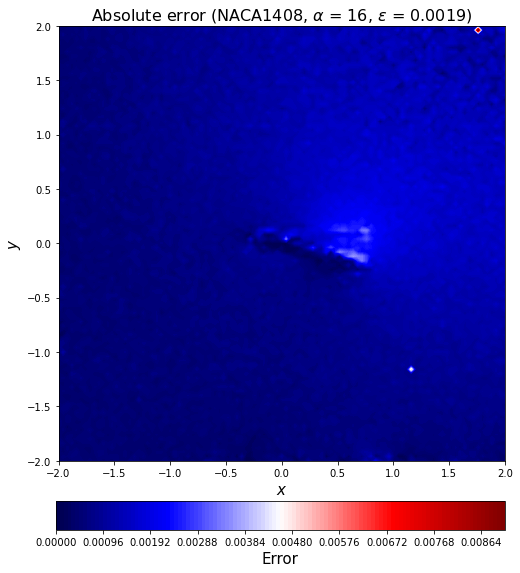

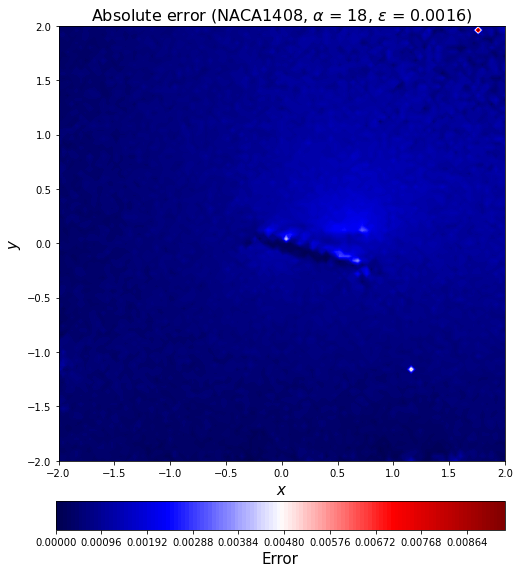

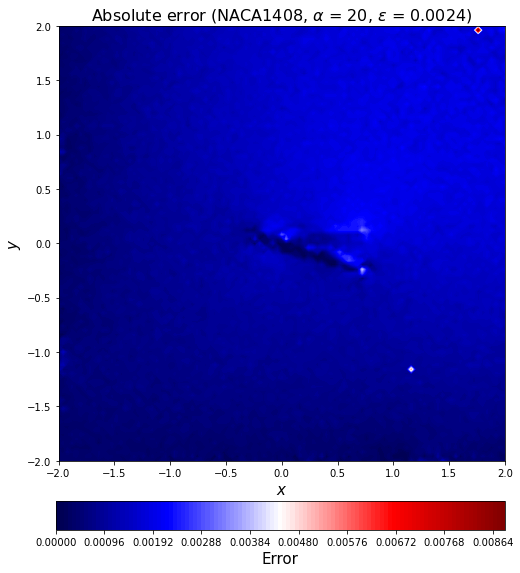

In [211]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221029PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

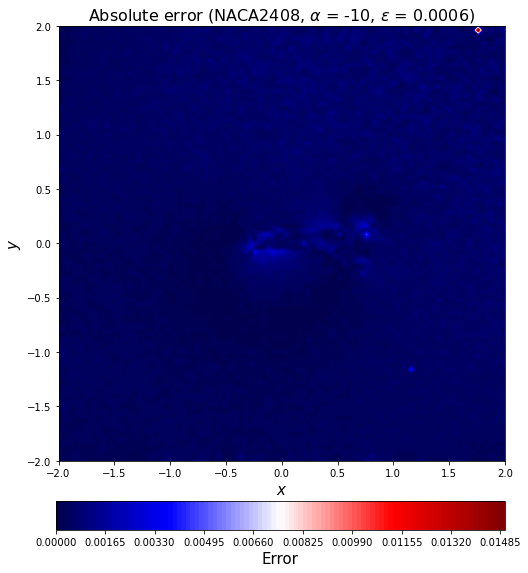

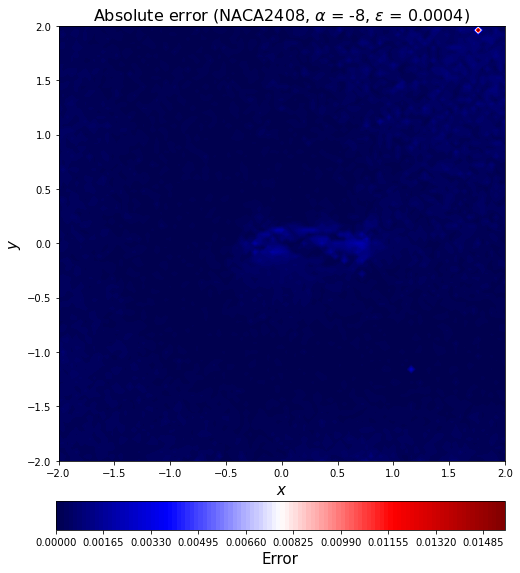

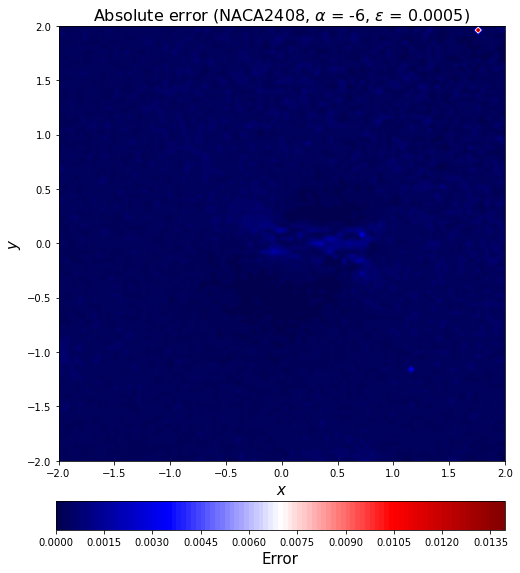

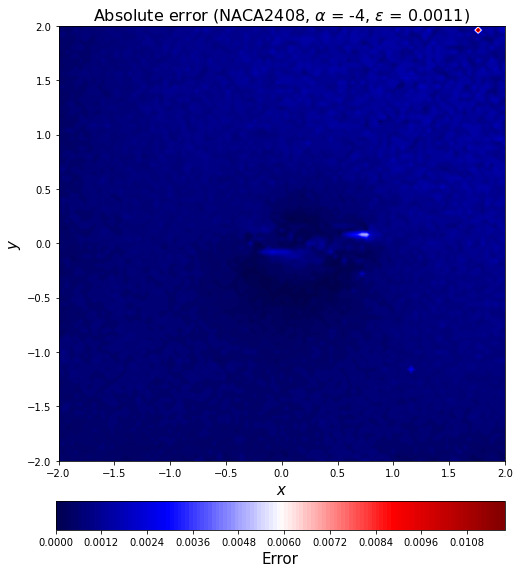

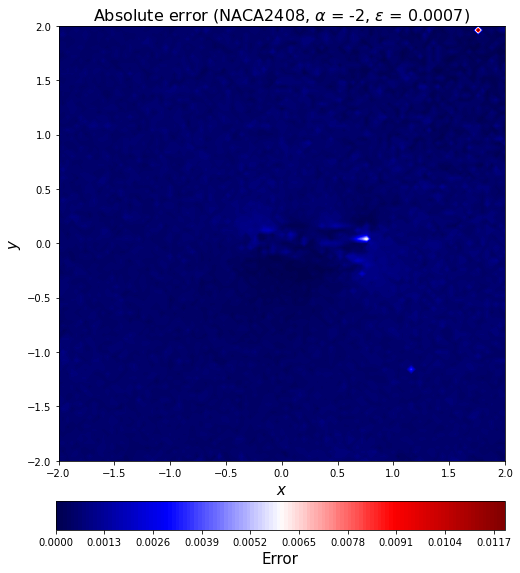

...

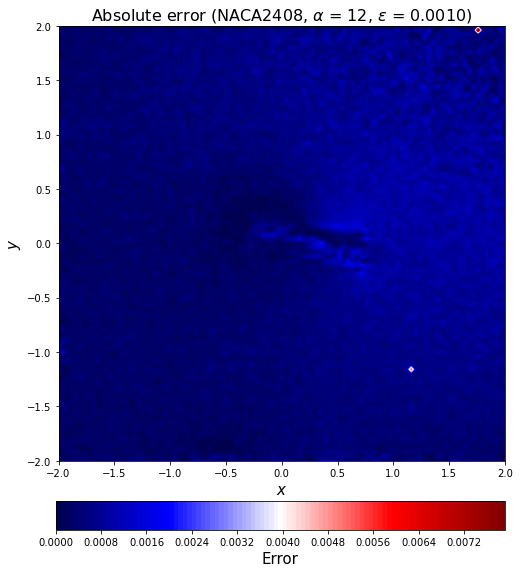

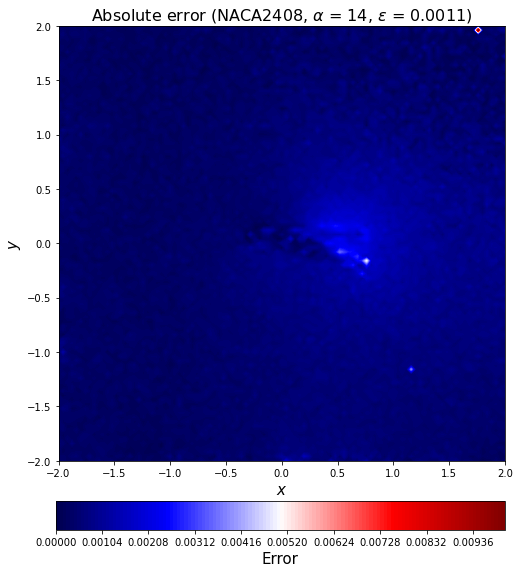

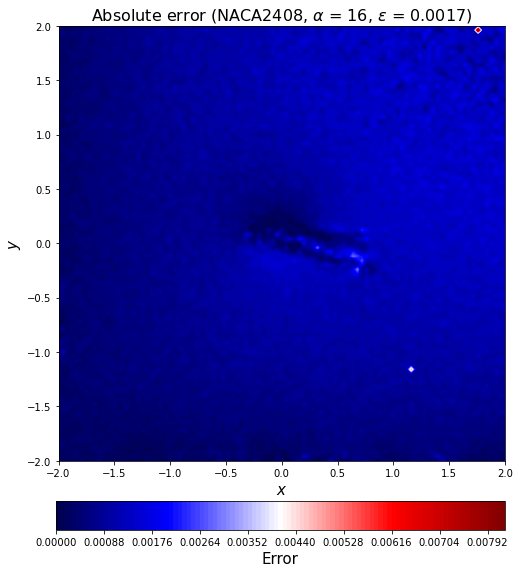

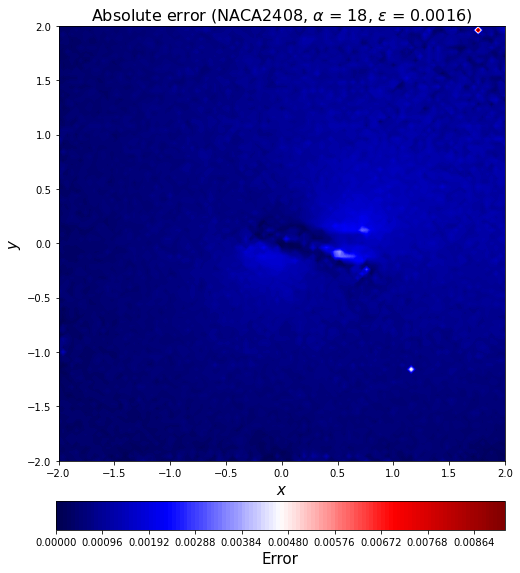

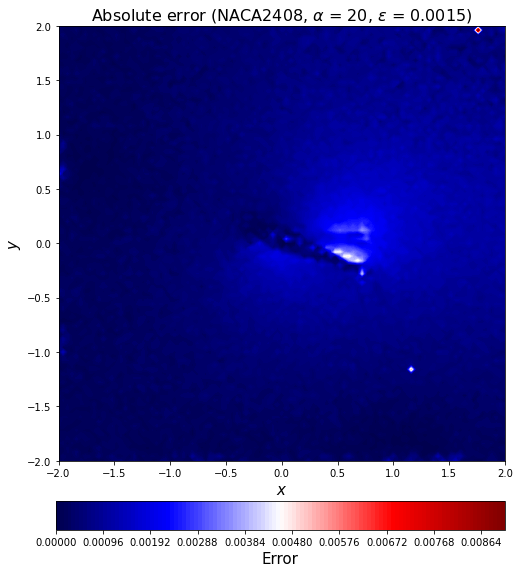

In [212]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[16*20+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221029PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

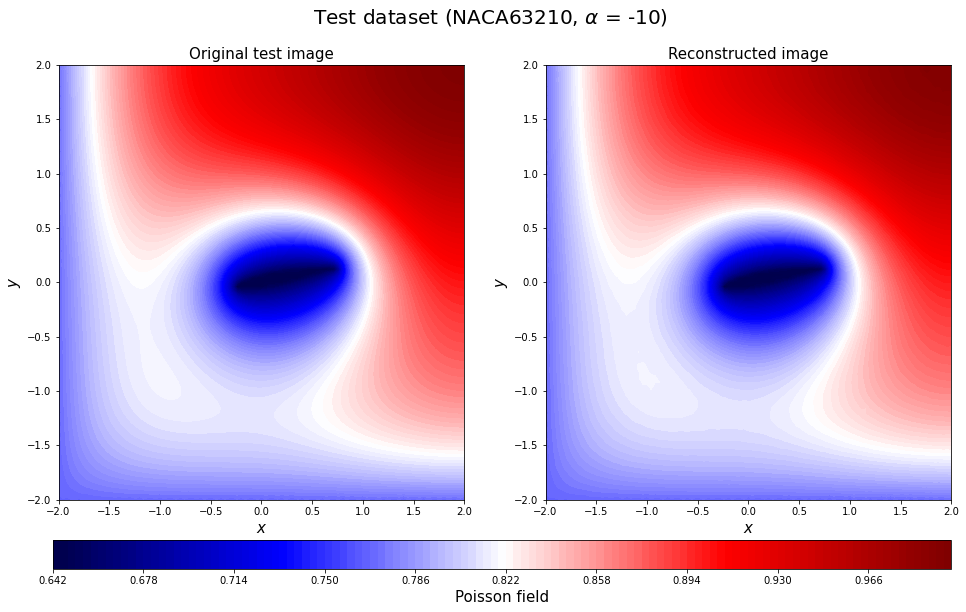

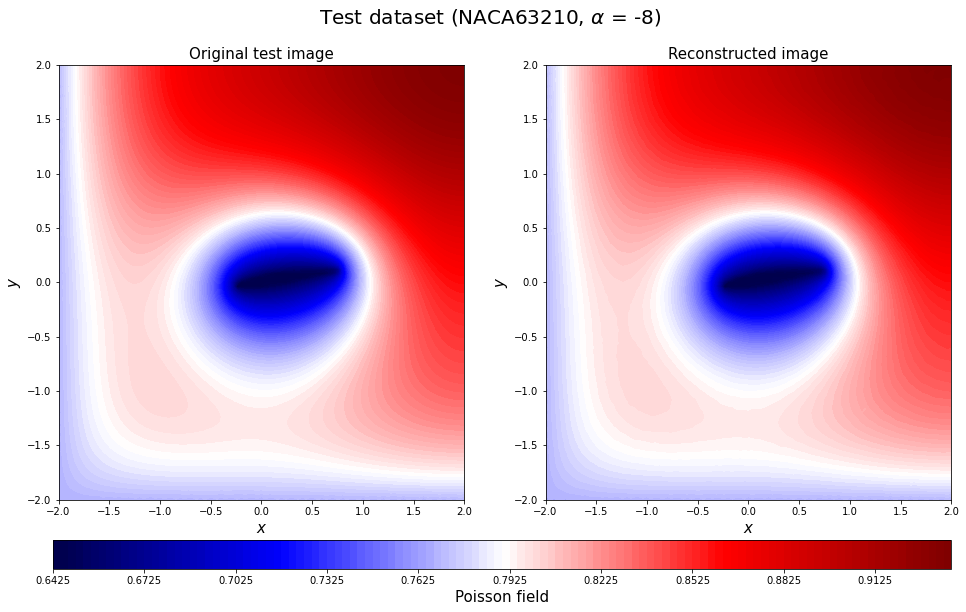

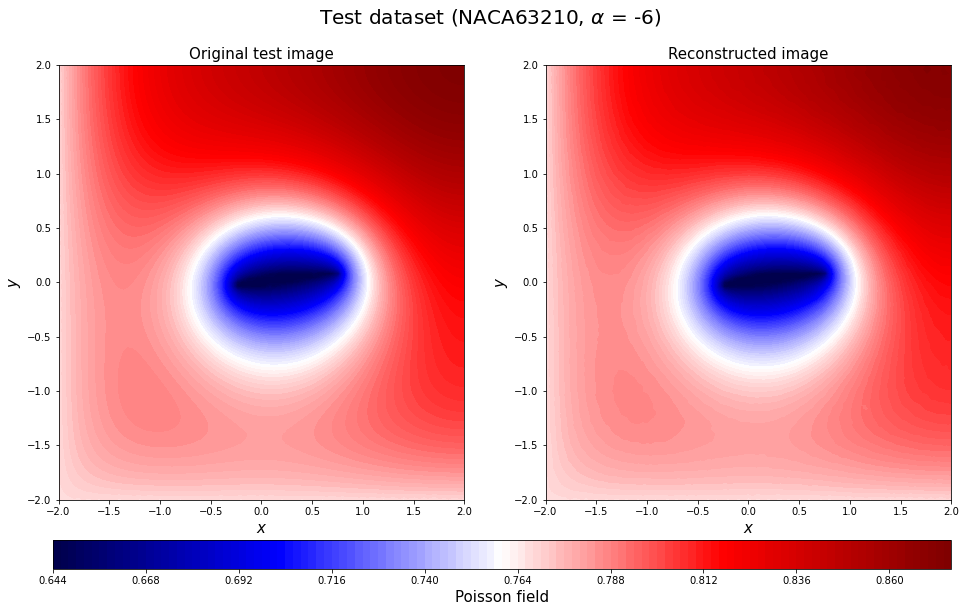

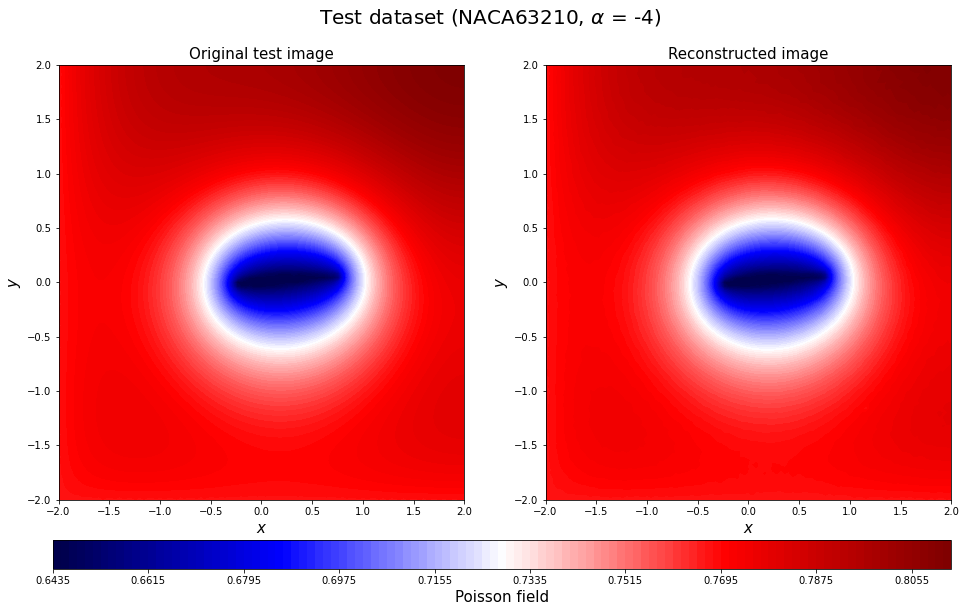

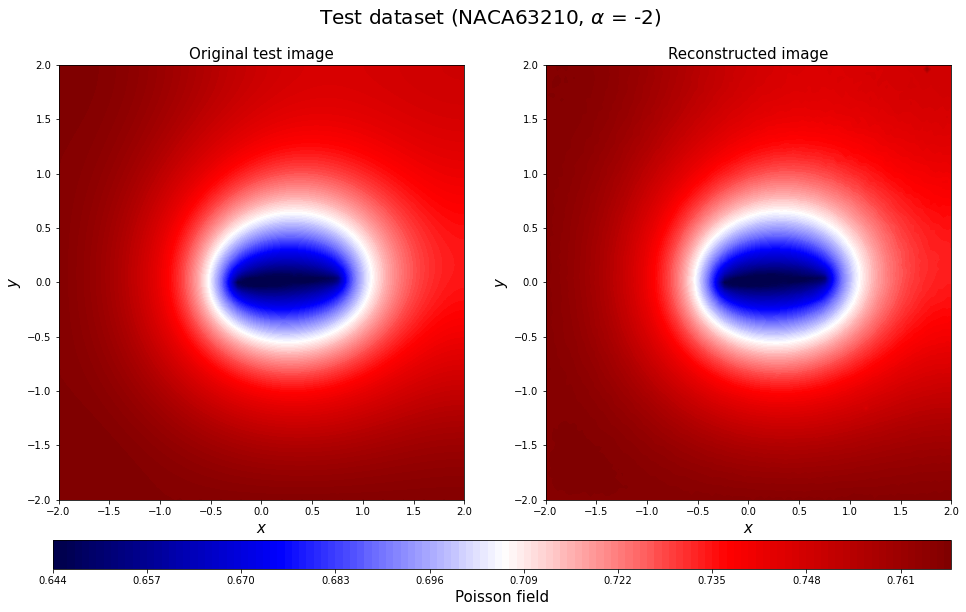

...

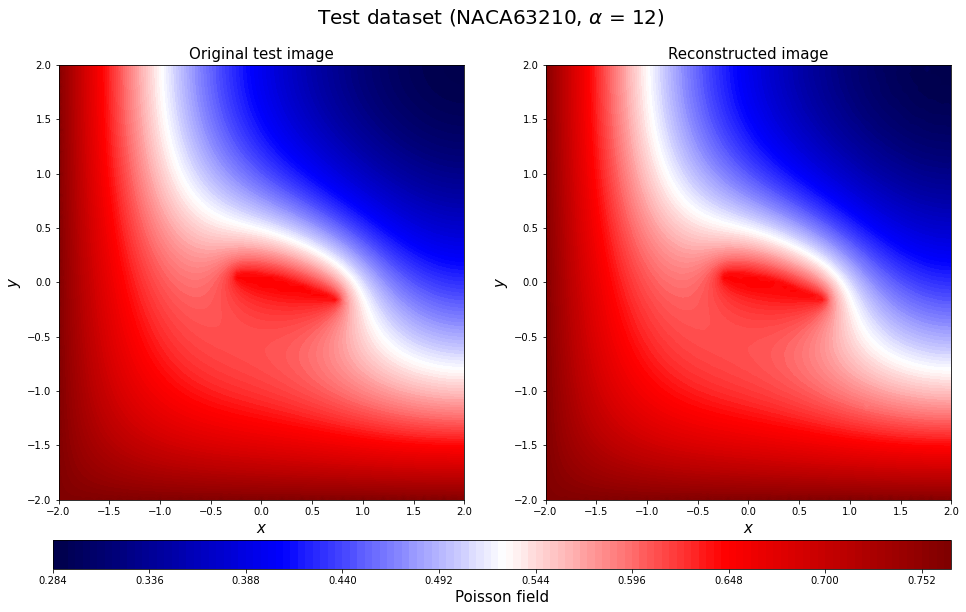

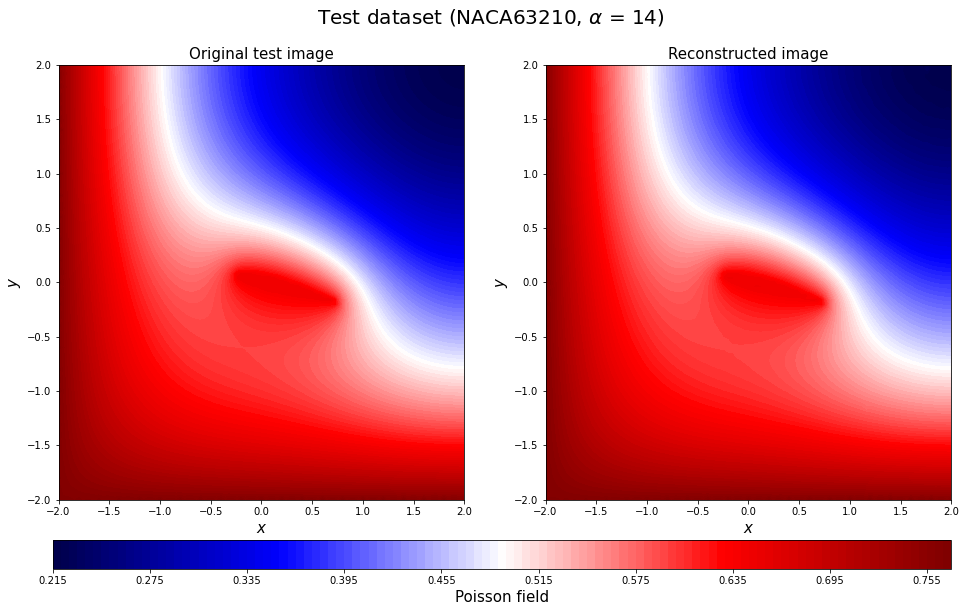

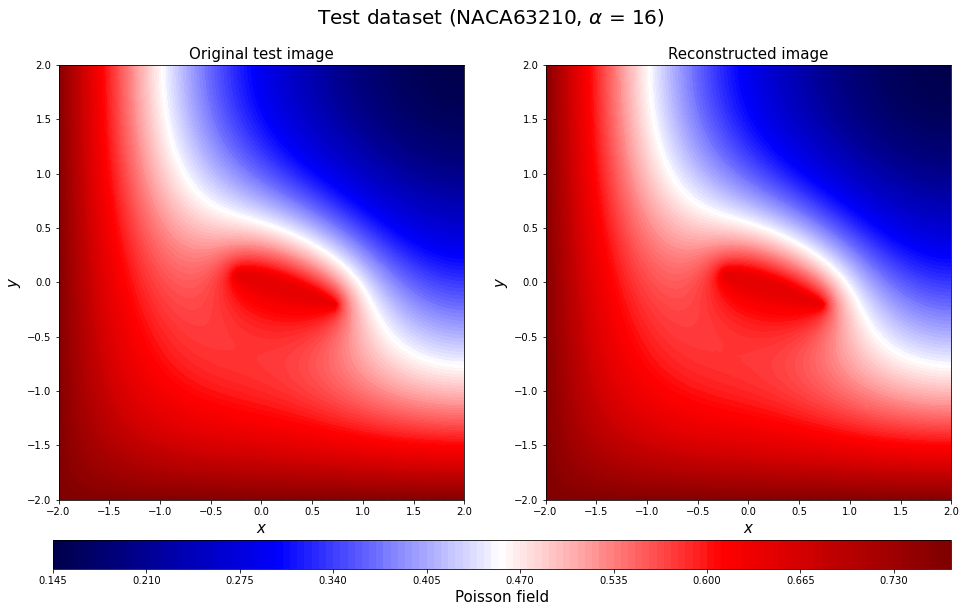

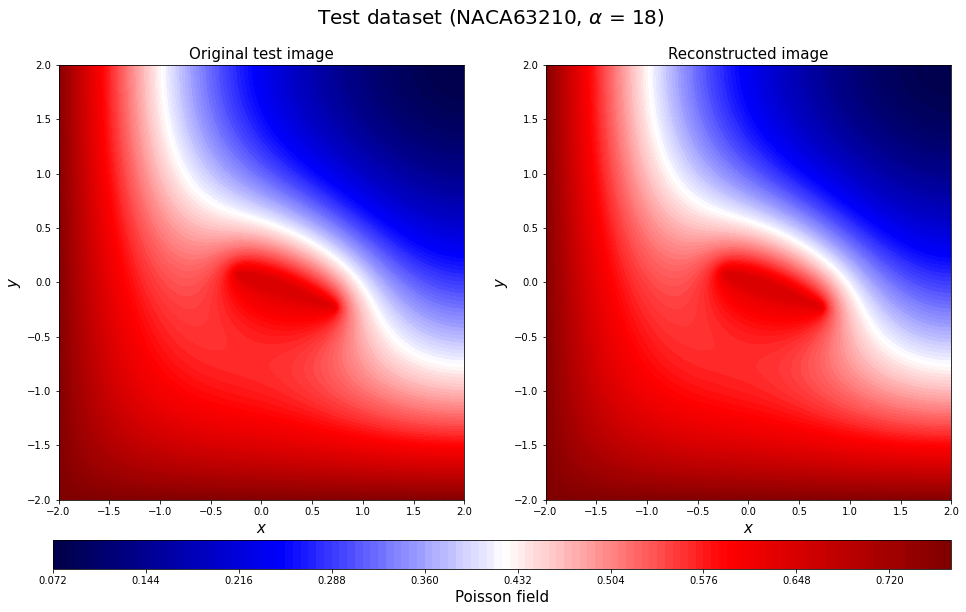

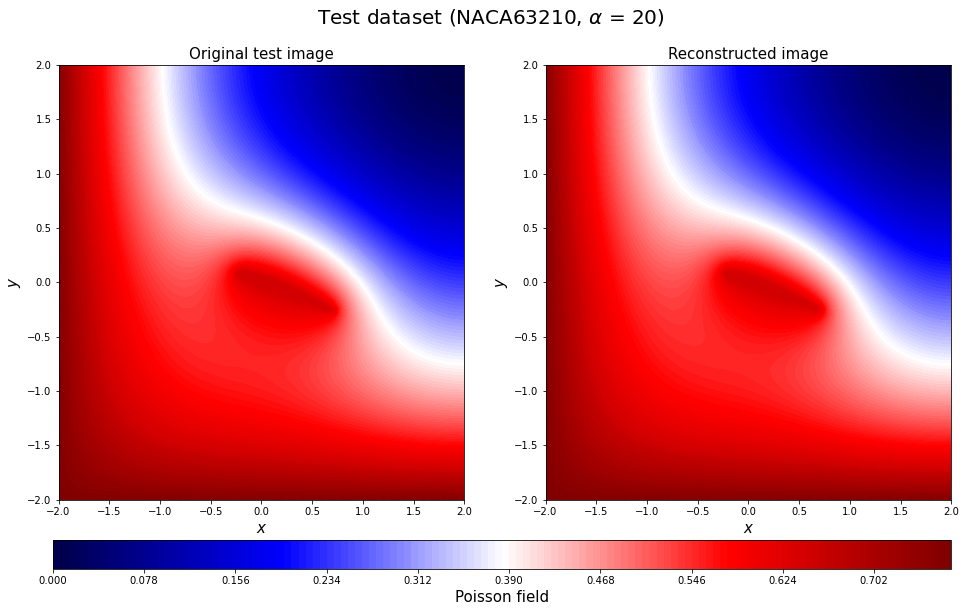

In [213]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, vmin=np.min(y_test2_rotate), 
                      vmax=np.max(y_test2_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test2_rotate), 
                      vmax=np.max(y_test2_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221029Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

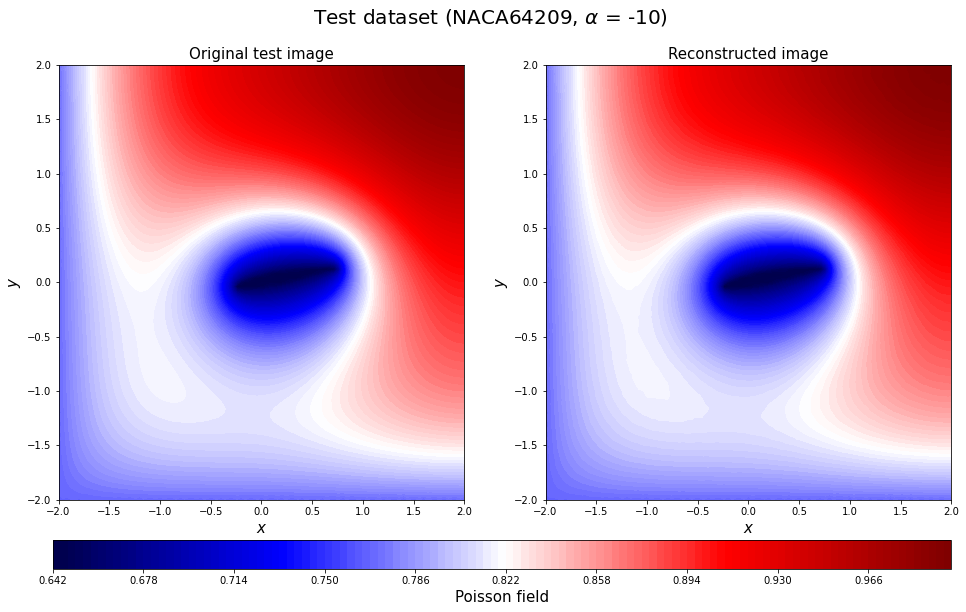

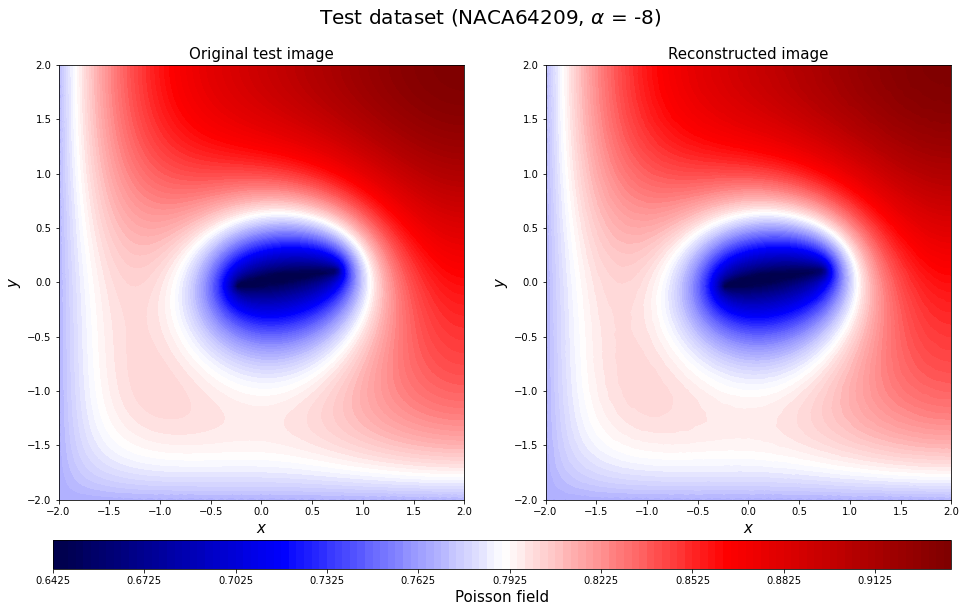

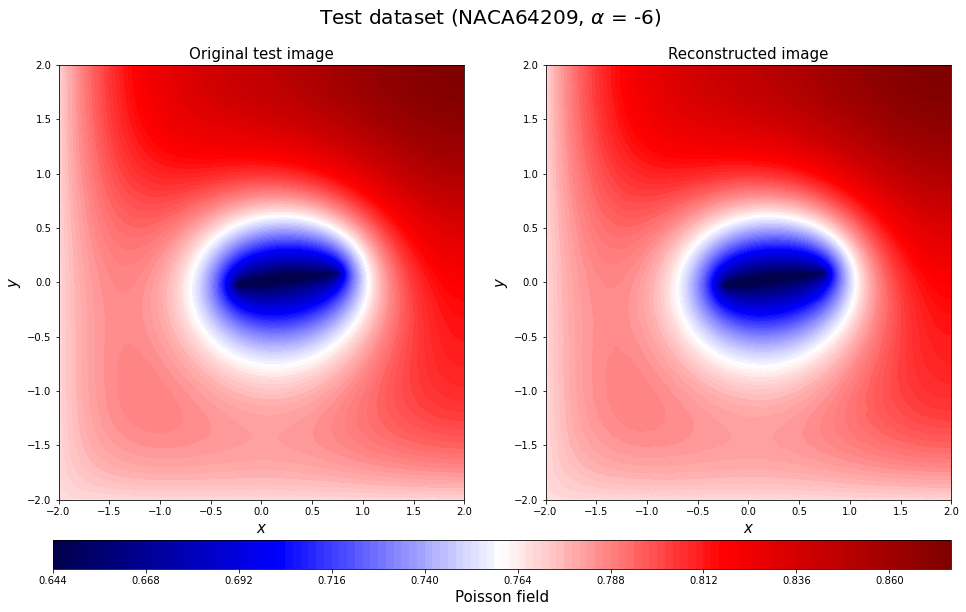

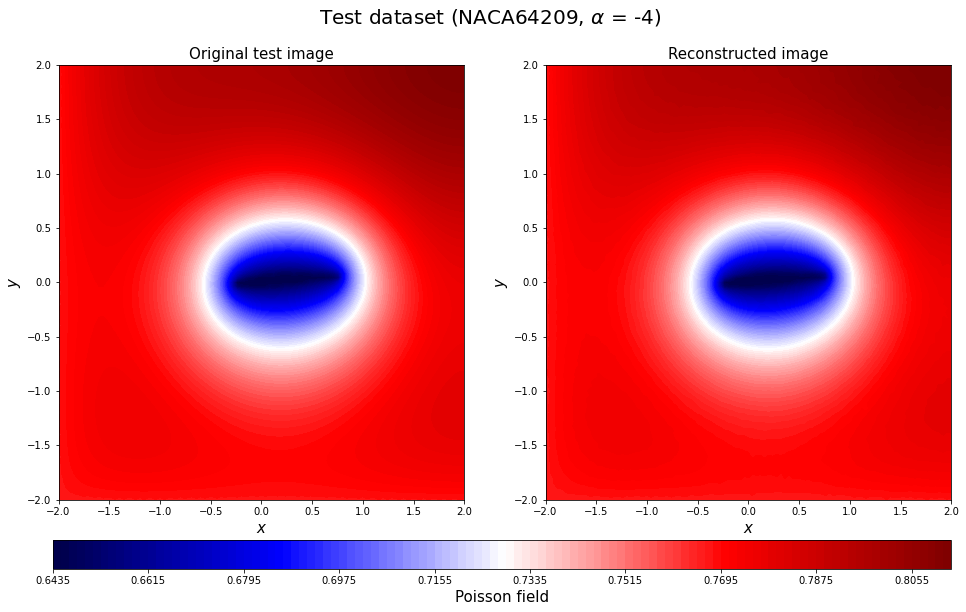

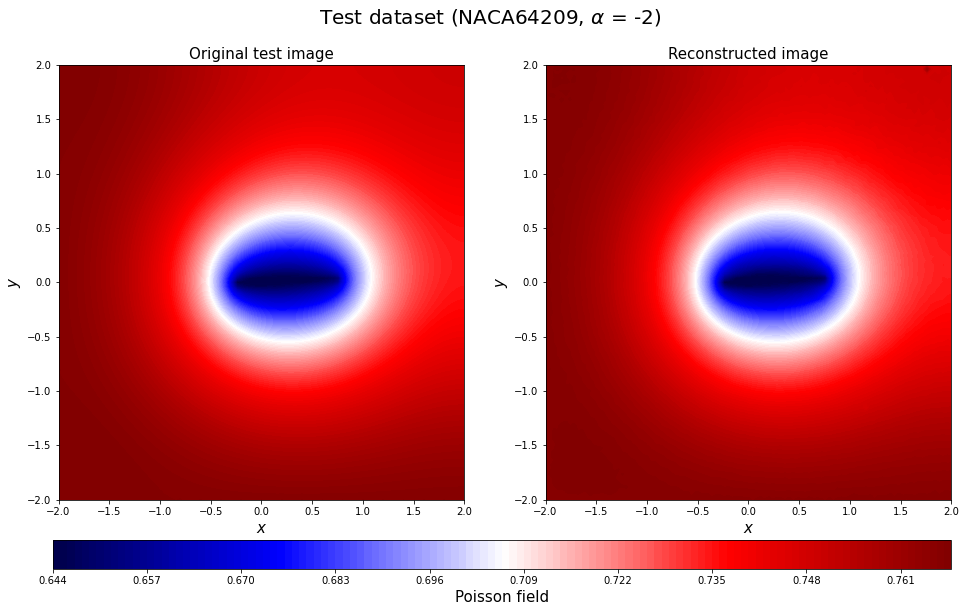

...

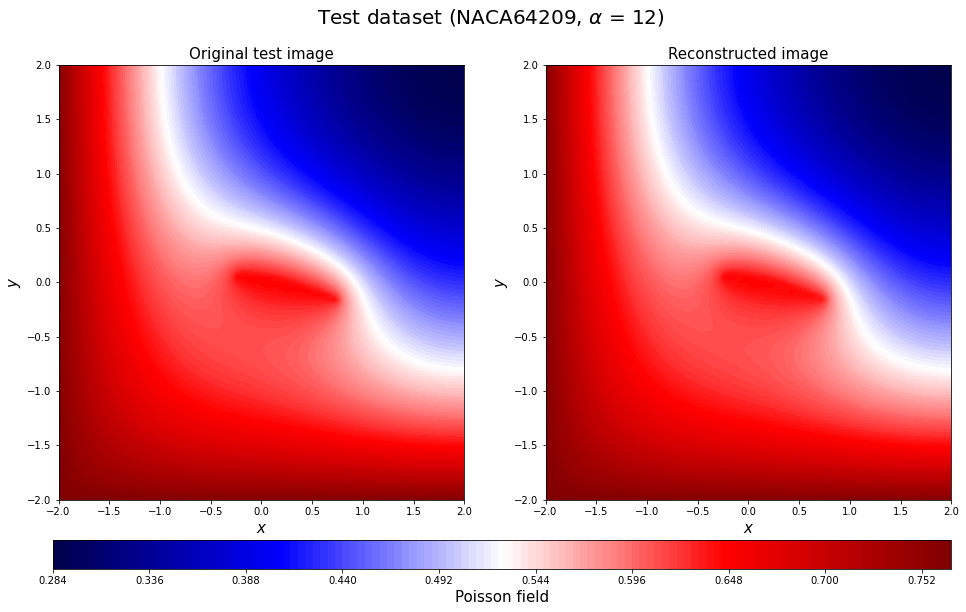

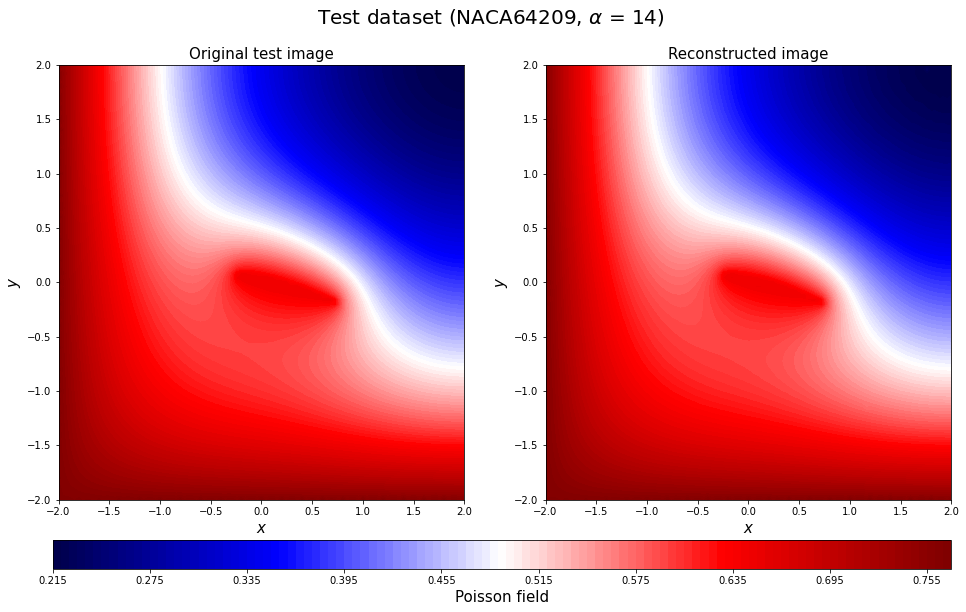

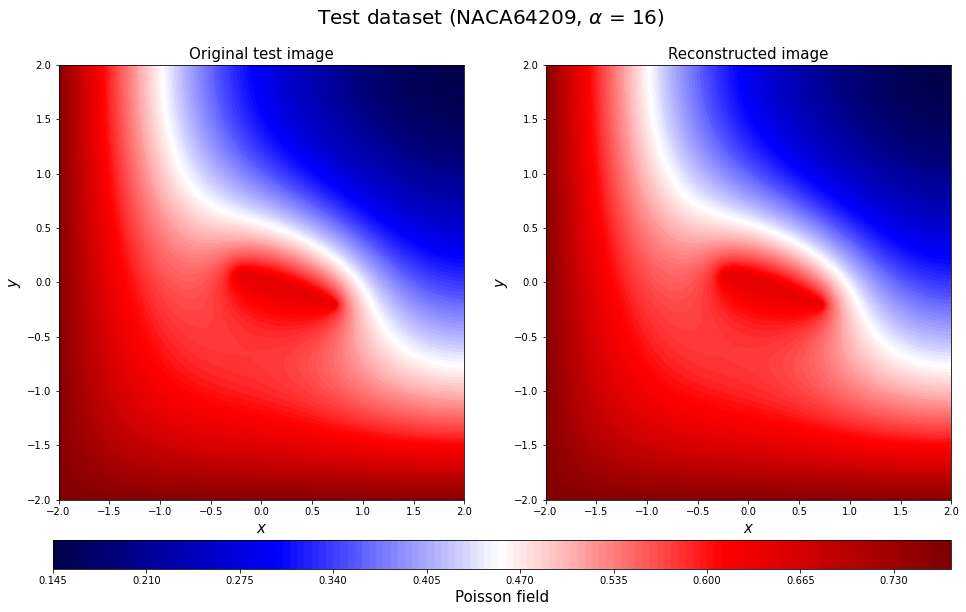

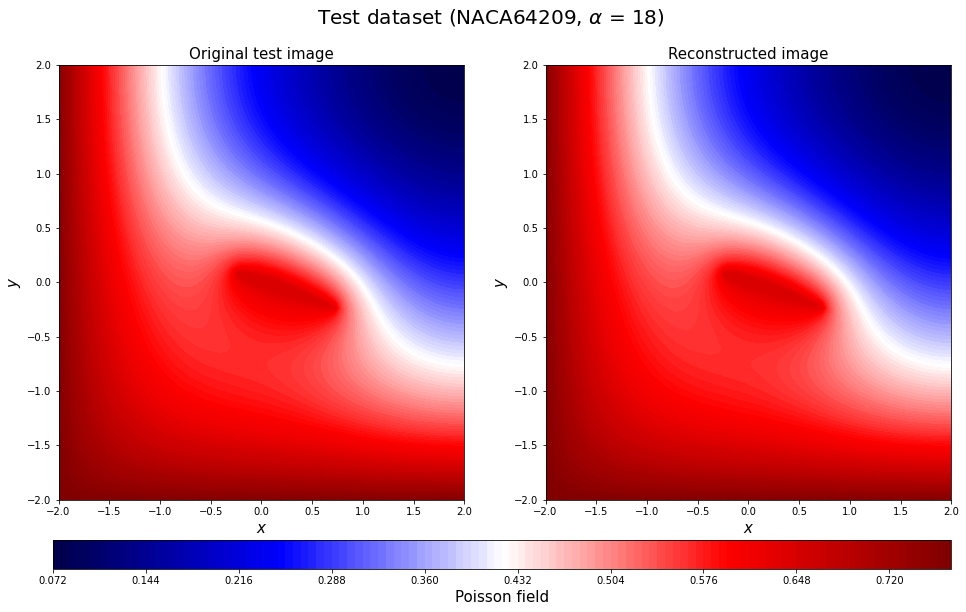

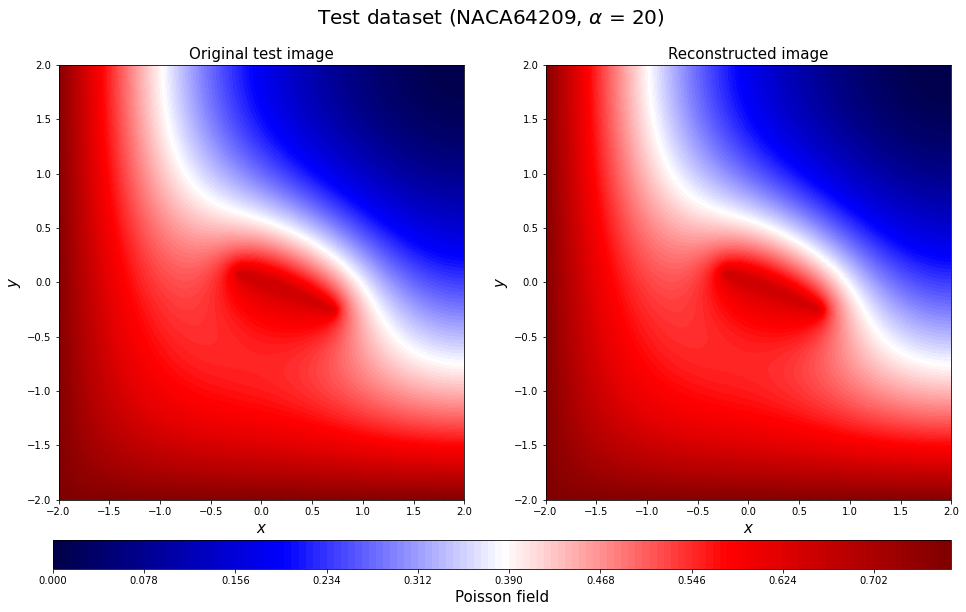

In [215]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                      vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                      vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221029Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

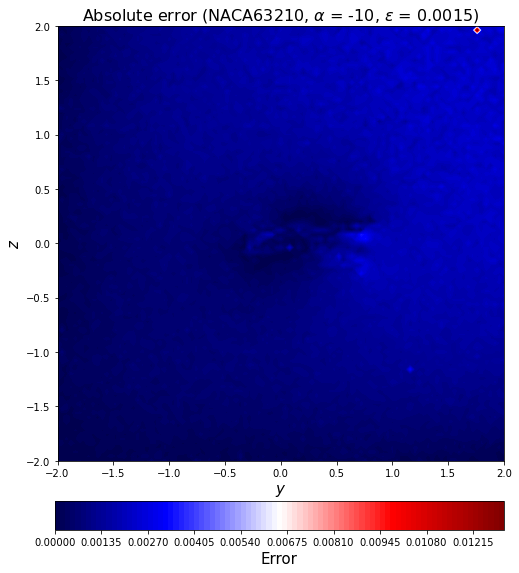

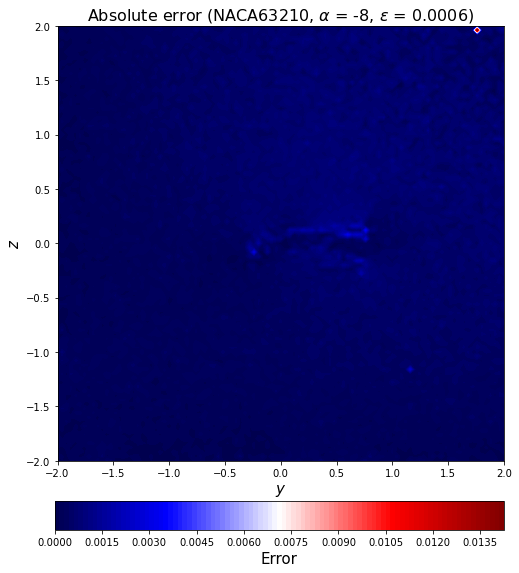

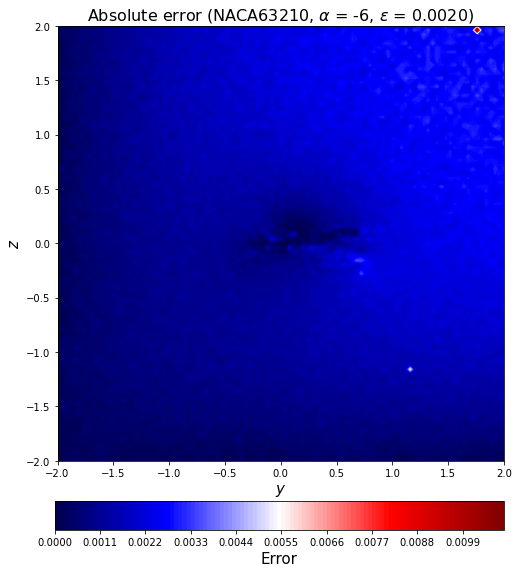

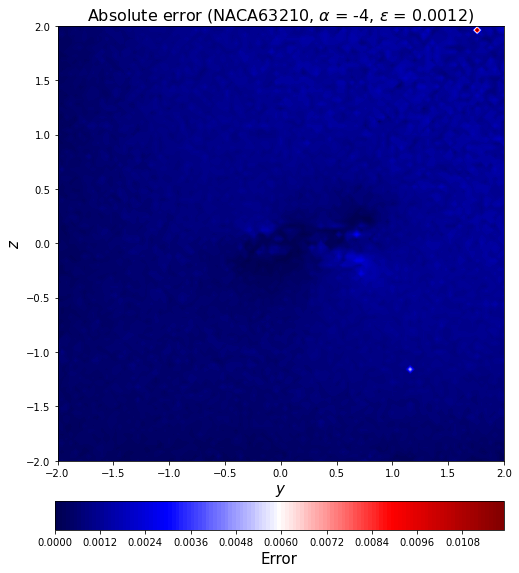

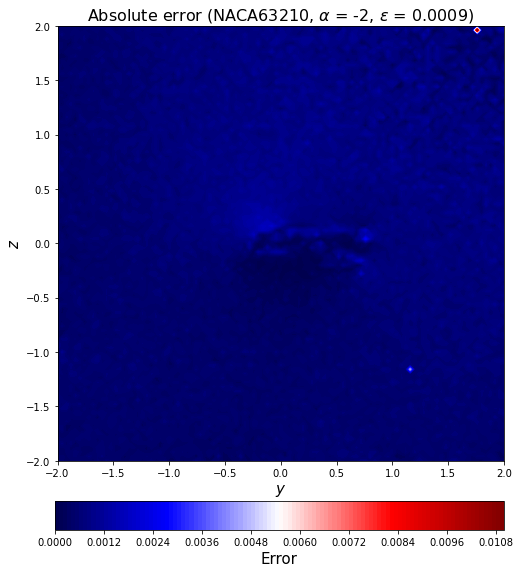

...

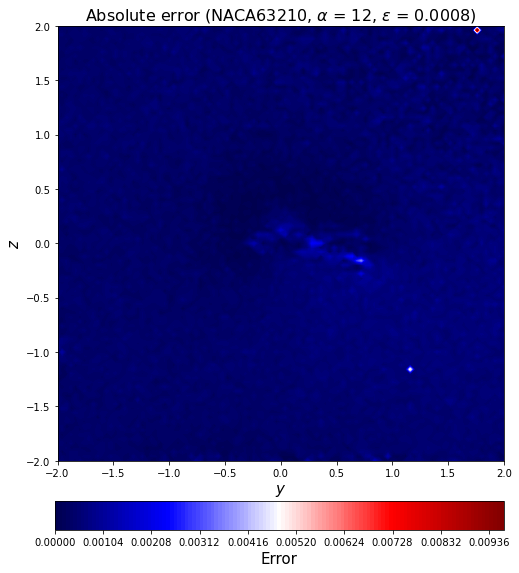

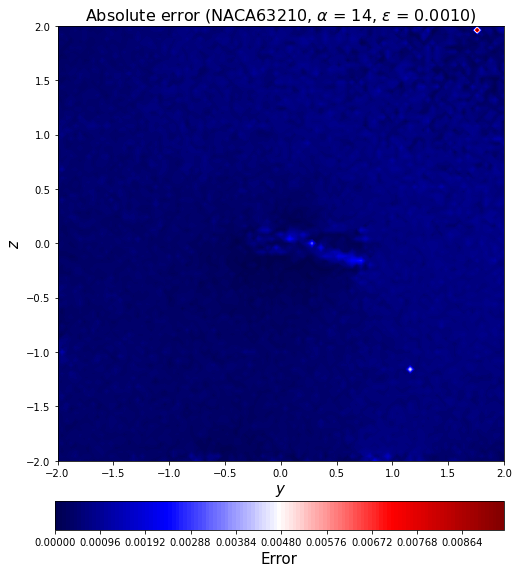

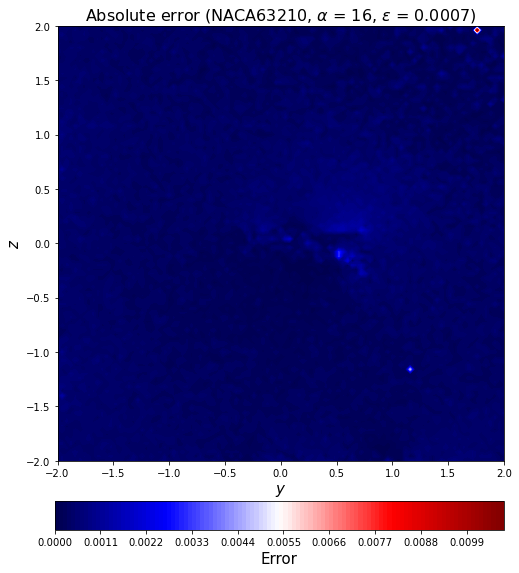

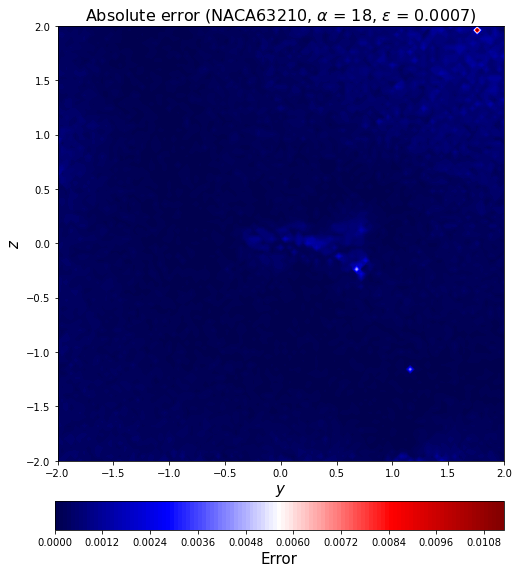

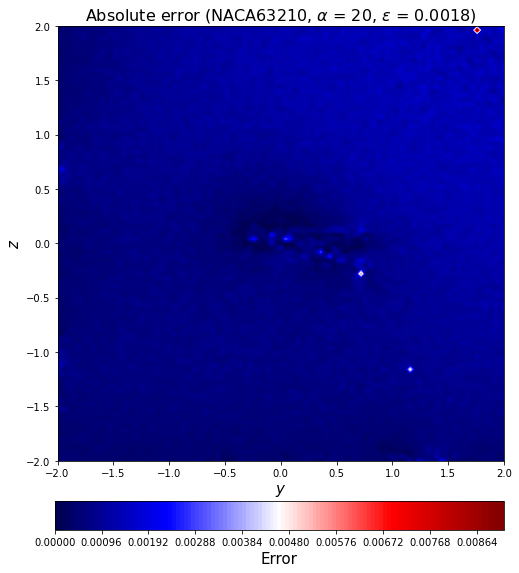

In [216]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221029PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

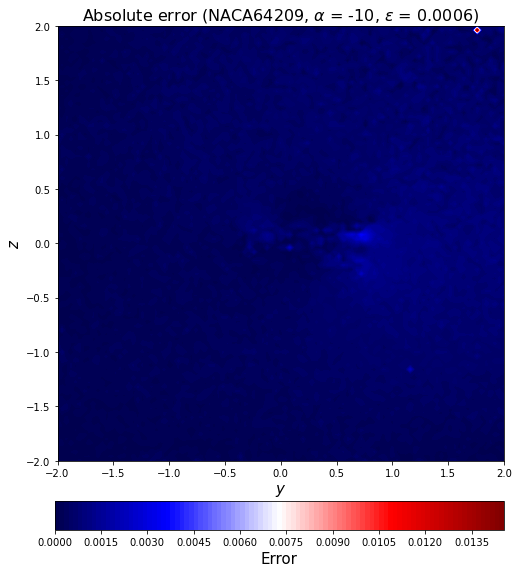

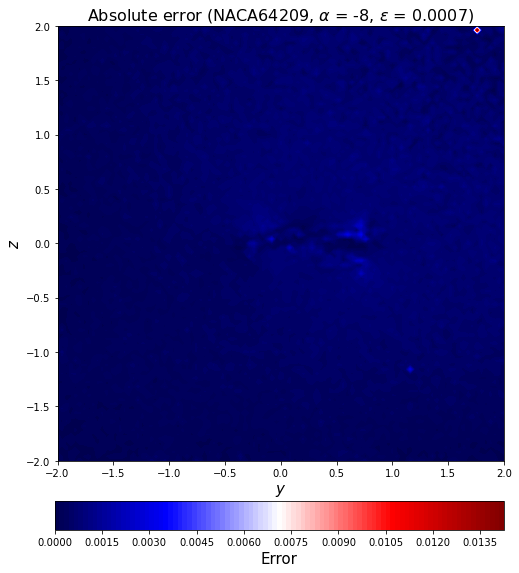

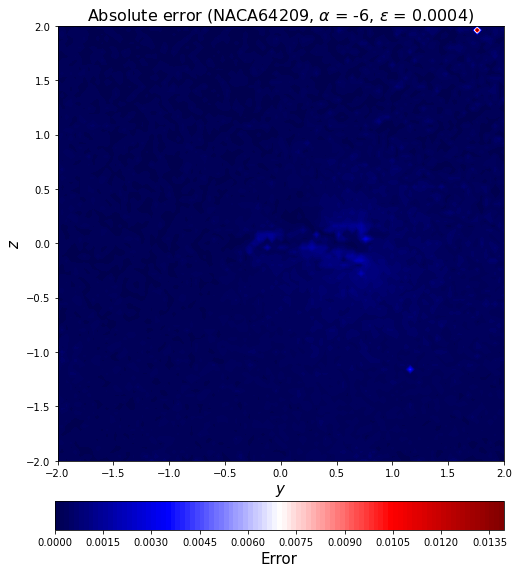

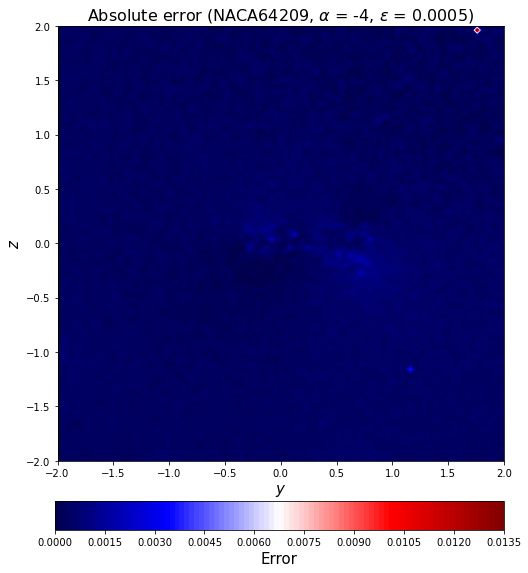

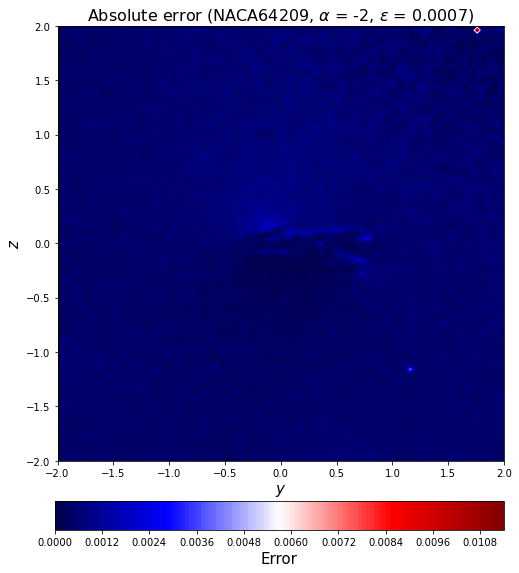

...

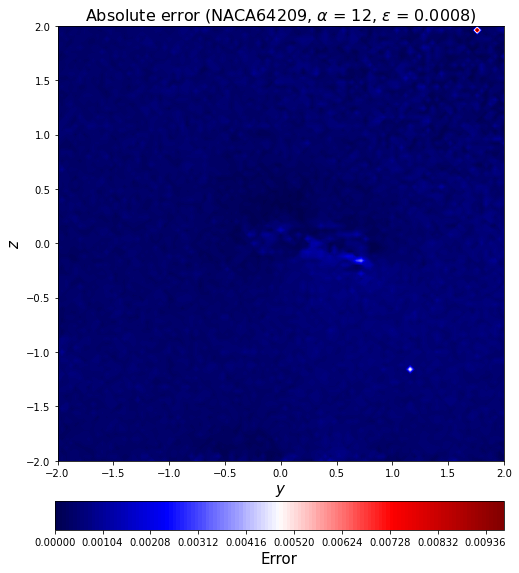

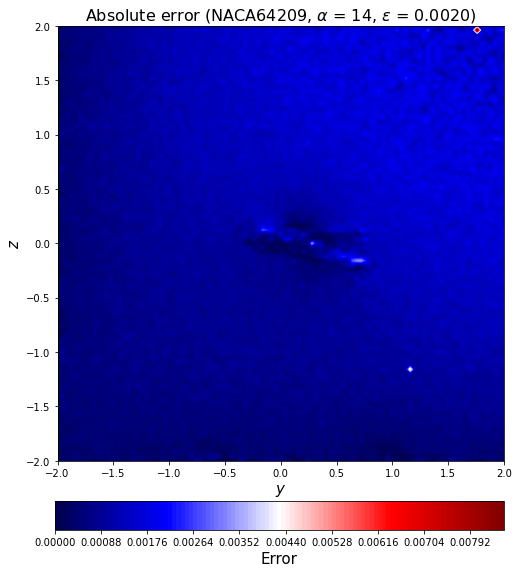

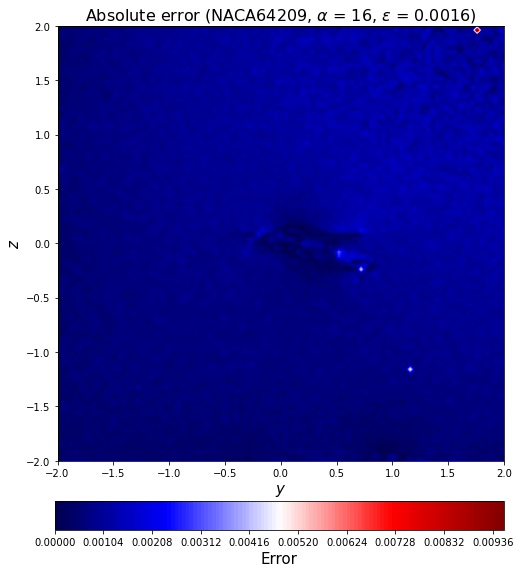

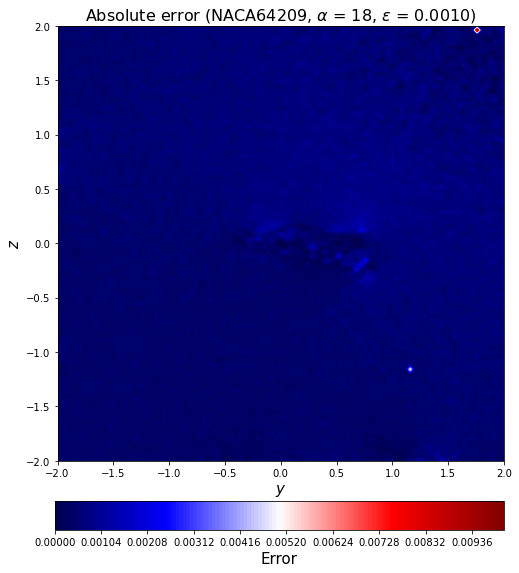

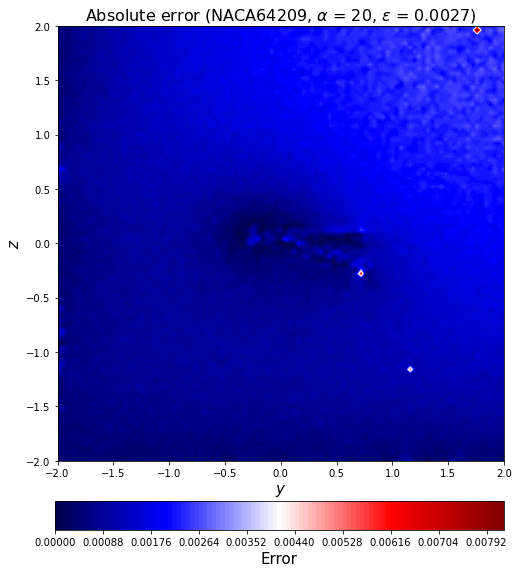

In [217]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221029PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [199]:
MAPE_train = (np.sum(np.abs(np.sum(y_train)-np.sum(decoded_train))) / np.abs(np.sum(y_train)))/(y_train.shape[0]/16)*100
acc_train = 1-MAPE_train

In [200]:
MAPE_test = (np.sum(np.abs(np.sum(y_test)-np.sum(decoded_test))) / np.abs(np.sum(y_test)))/(y_test.shape[0]/16)*100
acc_test = 1-MAPE_test

In [201]:
print(MAPE_train)
print(acc_train)

0.0002643918702943677
0.9997356081297056


In [202]:
print(MAPE_test)
print(acc_test)

0.025019296816861245
0.9749807031831388


In [218]:
MAPE_train_list = []
acc_train_list = []
for i in range(0, len(aa_train)):
    MAPE_train_data = (np.sum(np.abs(y_train[i]-decoded_train[i])) / np.sum(np.abs(y_train[i])))/(y_train.shape[0]/16)*100
    MAPE_train_list.append(MAPE_train_data)
    acc_train_data = 1 - MAPE_train_data
    acc_train_list.append(acc_train_data)
print(MAPE_train_list)
print(acc_train_list)

[0.0006527775862539285, 0.0004585982144479049, 0.0003675481613867449, 0.0008543646891265593, 0.0005831778344206731, 0.0011950652898301683, 0.0007233396591463588, 0.00024965008019142086, 0.0004375313559753418, 0.000401097659536655, 0.000601234868273089, 0.0008454572707997919, 0.0011447286889742538, 0.0013911564104703762, 0.0011895122299647968, 0.0018858276232978015, 0.0003225151145165658, 0.0006737618767896842, 0.00038338451145960374, 0.00038463115544052284, 0.00035854096104347626, 0.0007462545801315987, 0.0002873410658025956, 0.00020370973180365188, 0.001266055958663966, 0.0006162196000447686, 0.00039194711608724997, 0.0003137454796752709, 0.00038478414125923016, 0.000438007622967653, 0.0006541729457082698, 0.001772855724239266, 0.0008718548460927632, 0.0003618809540787369, 0.001017175793080326, 0.0009147169833472042, 0.0006755768299700376, 0.0005289425674646961, 0.0007012925296111743, 0.0007932260663150735, 0.00047782523495733096, 0.0003944192095507025, 0.0006034521430104781, 0.000776

In [219]:
MAPE_test_list = []
acc_test_list = []
for i in range(0, len(aa_test)):
    MAPE_test_data = (np.sum(np.abs(y_test[i]-decoded_test[i])) / np.sum(np.abs(y_test[i])))/(y_test.shape[0]/16)*100
    MAPE_test_list.append(MAPE_test_data)
    acc_test_data = 1 - MAPE_test_data
    acc_test_list.append(acc_test_data)
print(MAPE_test_list)
print(acc_test_list)

[0.007255945987121619, 0.00827541726125587, 0.004659838433662007, 0.006447301799648145, 0.009497030217802757, 0.024787651107912024, 0.006940886148547651, 0.005503106890550122, 0.012680585435774475, 0.007639977099854898, 0.009469038217188292, 0.010794790048704317, 0.026939034619426695, 0.02229129010528118, 0.014917330671871185, 0.03812055193463481, 0.009251811346209456, 0.030326477188478827, 0.005835610447160287, 0.010807229900261124, 0.030827341757407756, 0.03769015916530401, 0.033055105015951415, 0.06544556576961899, 0.03640533865248235, 0.03730983841023817, 0.05040035488646258, 0.0492311927341696, 0.05309155113265489, 0.06616864902551027, 0.023419621625467967, 0.02573522020780194, 0.018131031504095785, 0.007361290457616337, 0.025145842944810145, 0.015286955687393439, 0.011477939565993323, 0.021679005406762483, 0.008158593148720155, 0.011412800946269926, 0.01992456038030063, 0.006453855100794654, 0.011235818457679604, 0.010093577194132411, 0.01341366178362323, 0.009366347638480562, 0.

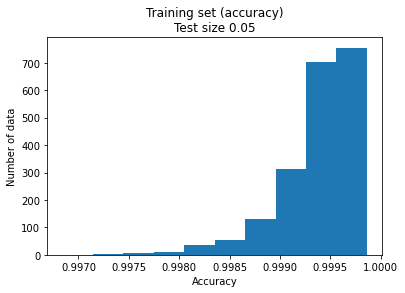

In [220]:
plt.hist(acc_train_list)
plt.title('Training set (accuracy)\nTest size 0.05')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
#plt.grid()
plt.show()

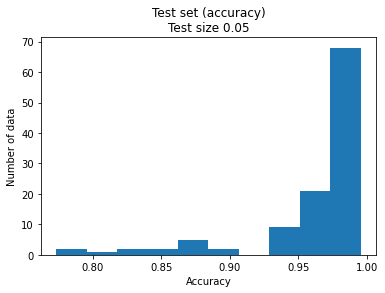

In [221]:
plt.hist(acc_test_list)
plt.title('Test set (accuracy)\nTest size 0.05')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

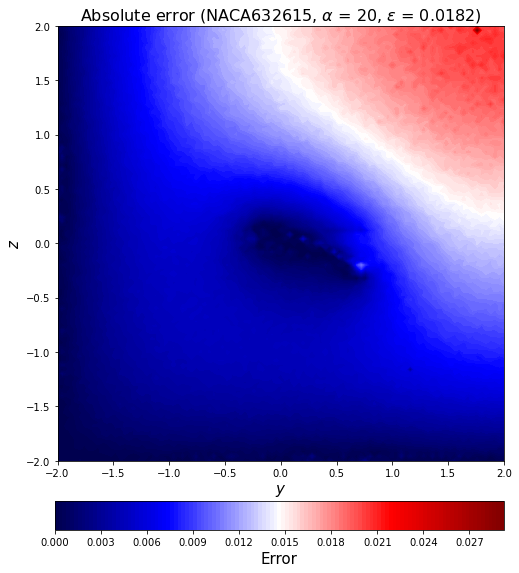

In [222]:
error_test_abs2_rotate = error_test_abs[-1].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-1])[3:-2],
                                                                   aa_test[-1], l2_error_test_list[-1]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221029PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-1])[3:-2])+str(aa_test[-1])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

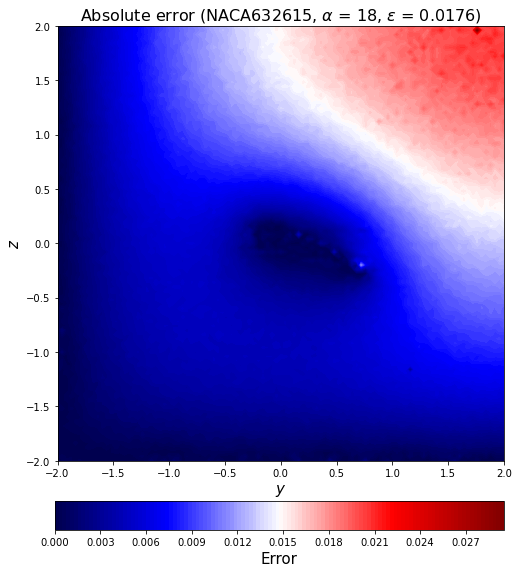

In [223]:
error_test_abs2_rotate = error_test_abs[-2].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-2])[3:-2],
                                                                   aa_test[-2], l2_error_test_list[-2]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221029PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-2])[3:-2])+str(aa_test[-2])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

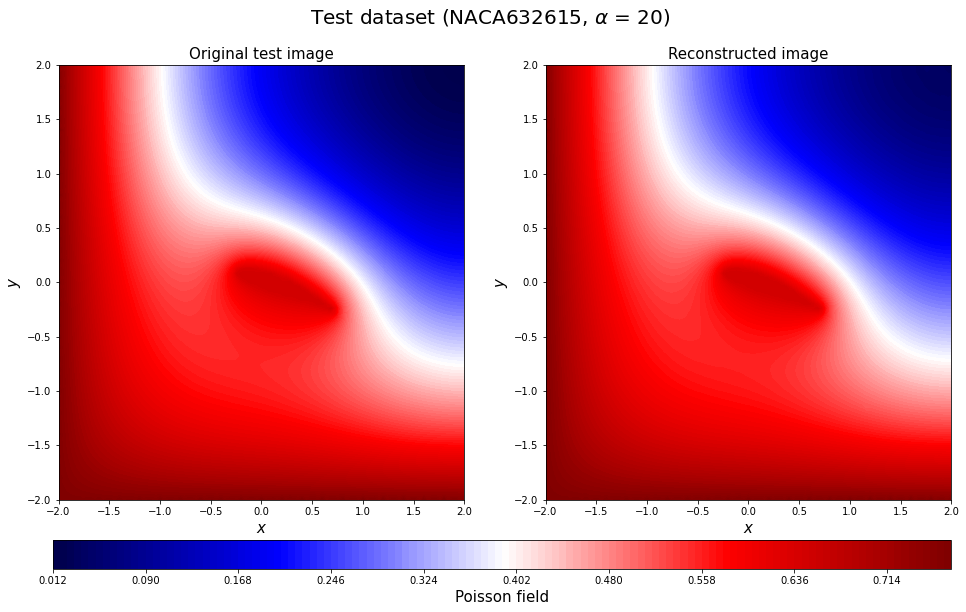

In [224]:
c=-1
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221029Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

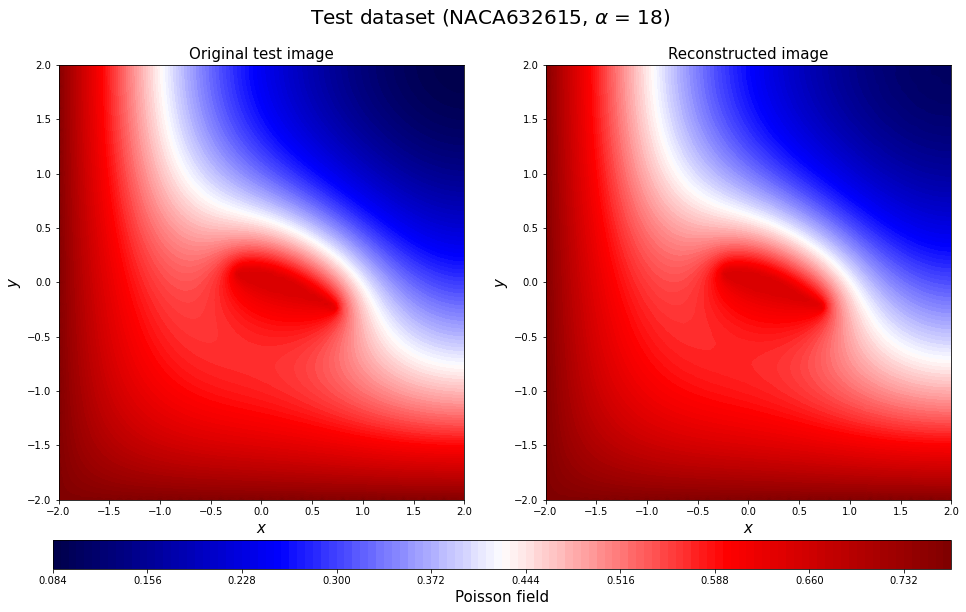

In [225]:
c=-2
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221029Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

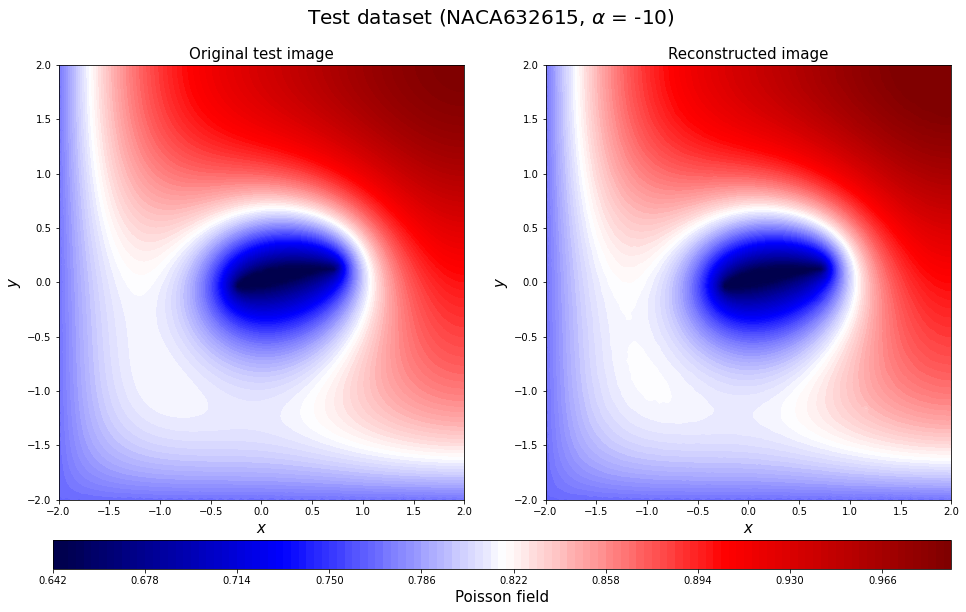

In [226]:
c=-16
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221029Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

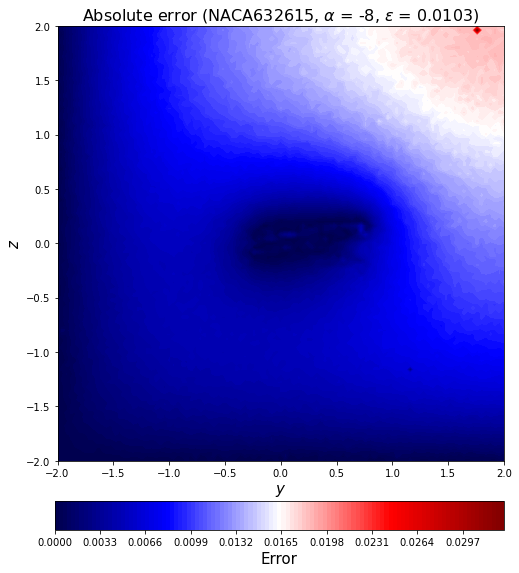

In [227]:
error_test_abs2_rotate = error_test_abs[-15].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-15])[3:-2],
                                                                   aa_test[-15], l2_error_test_list[-15]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221029PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-15])[3:-2])+str(aa_test[-15])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

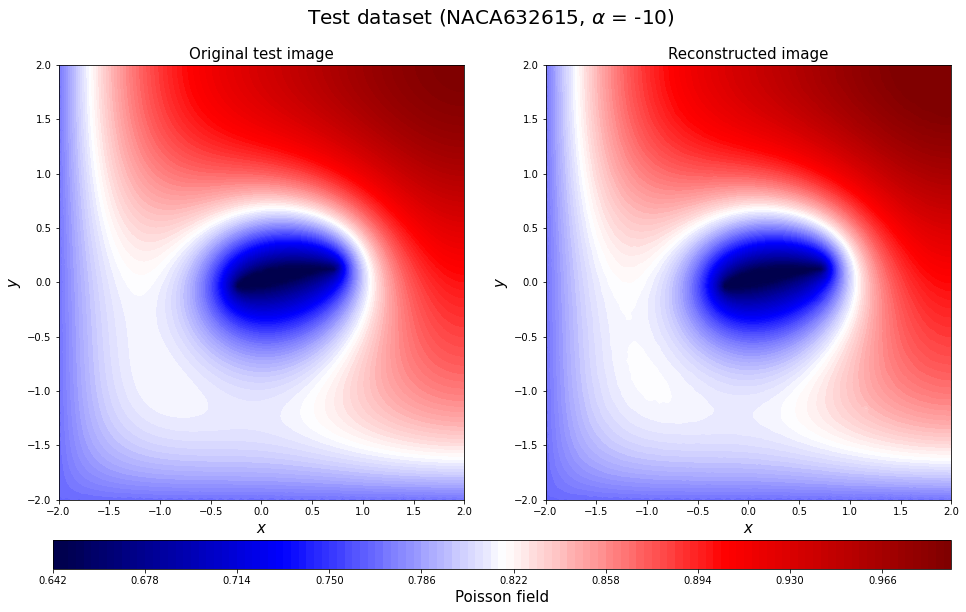

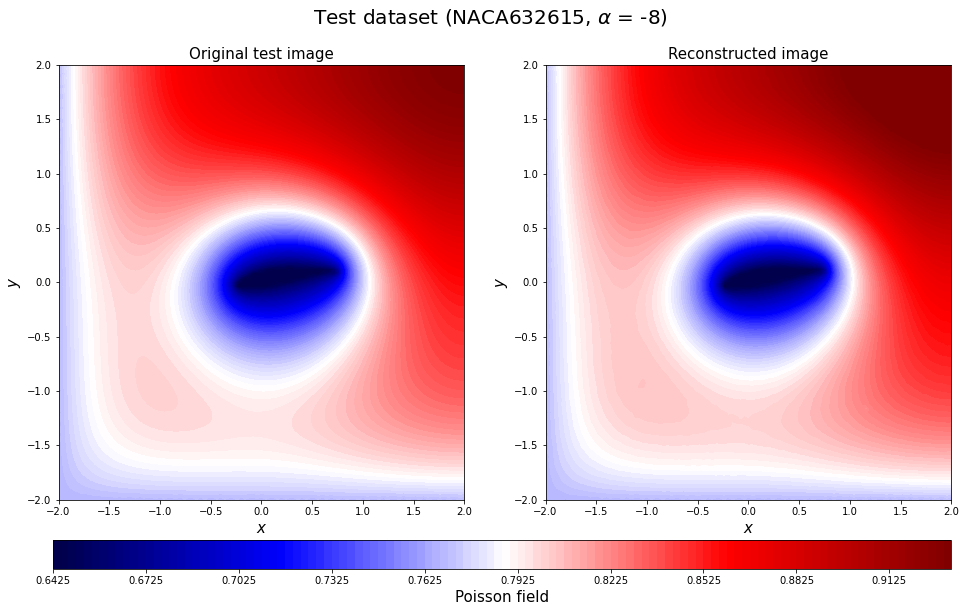

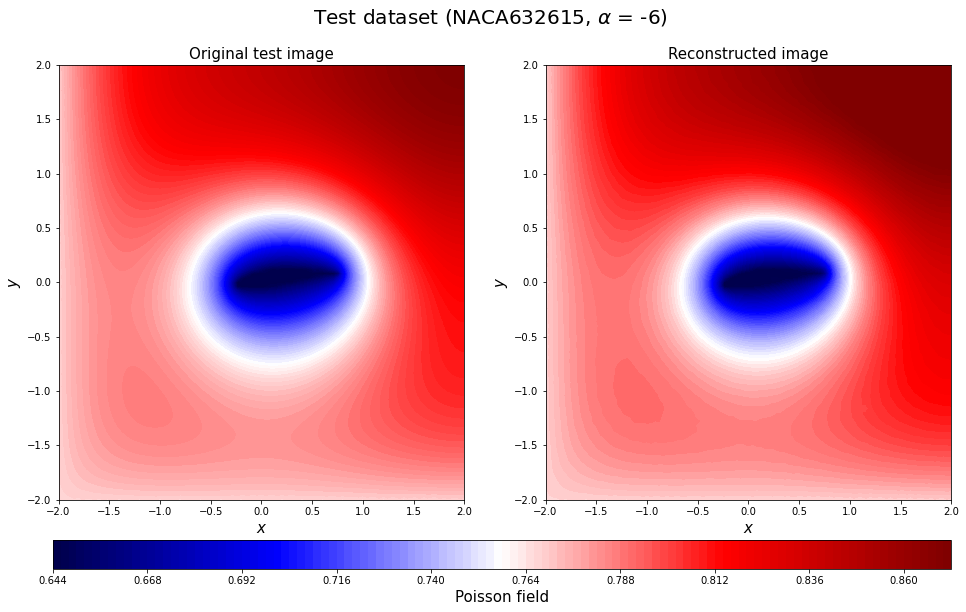

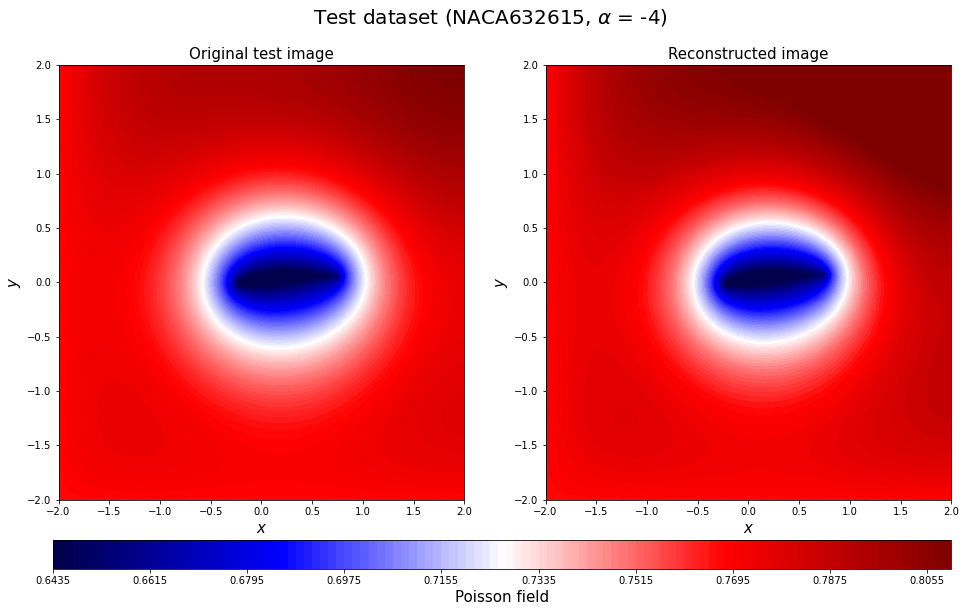

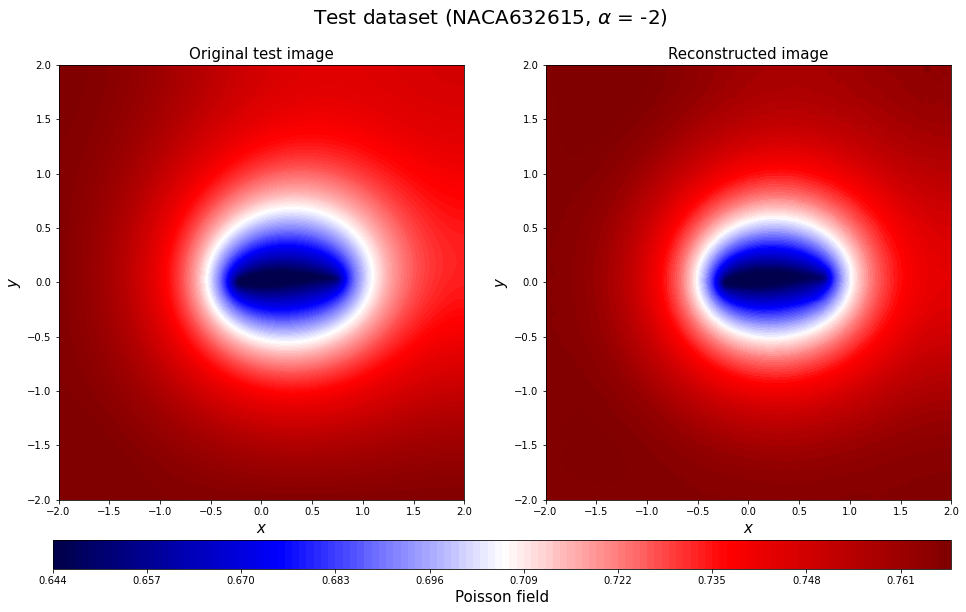

...

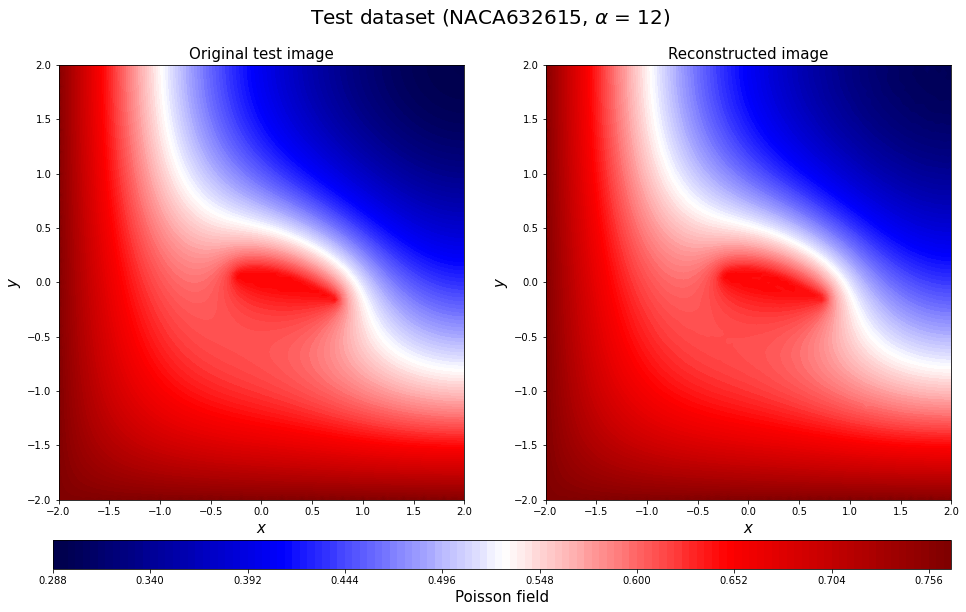

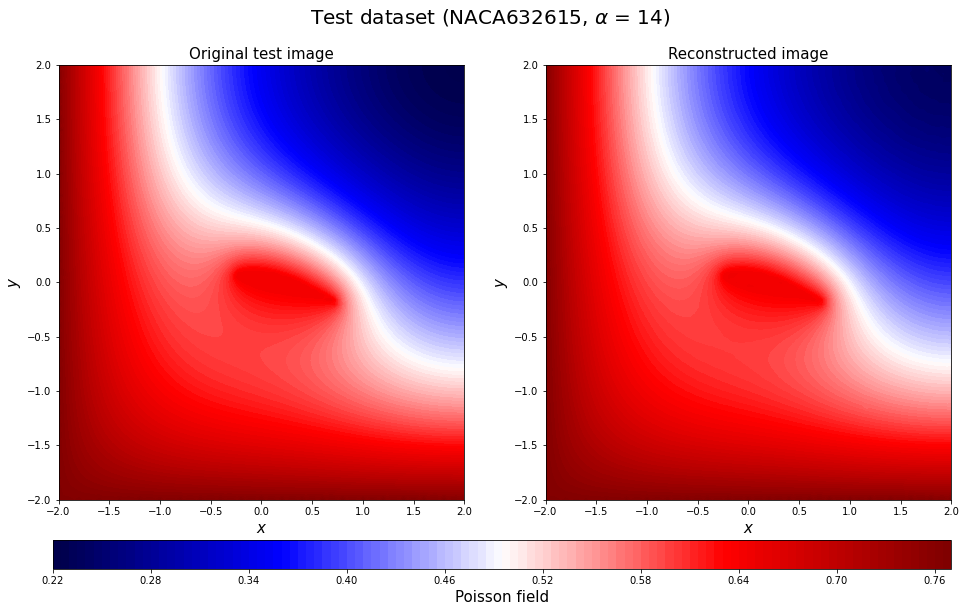

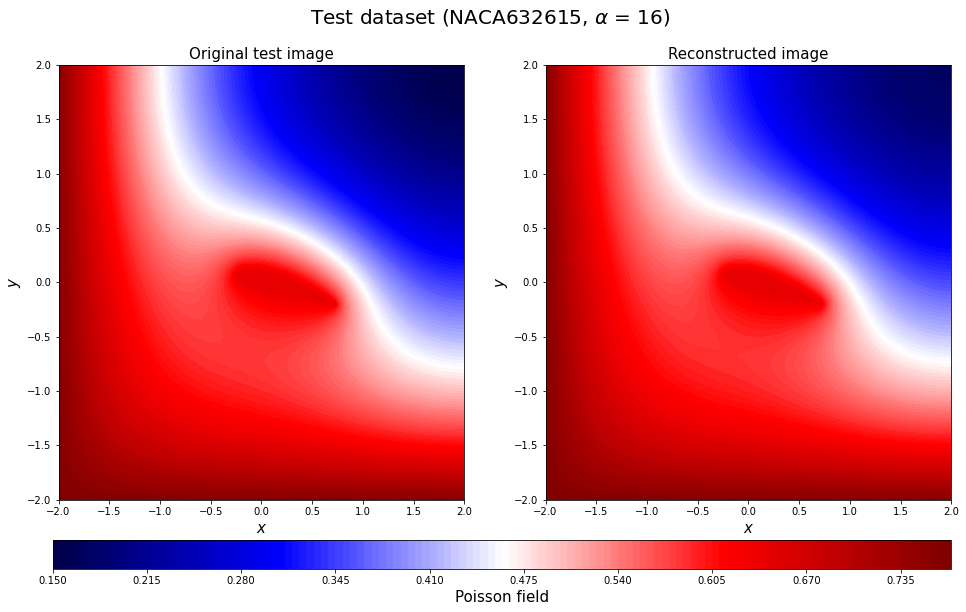

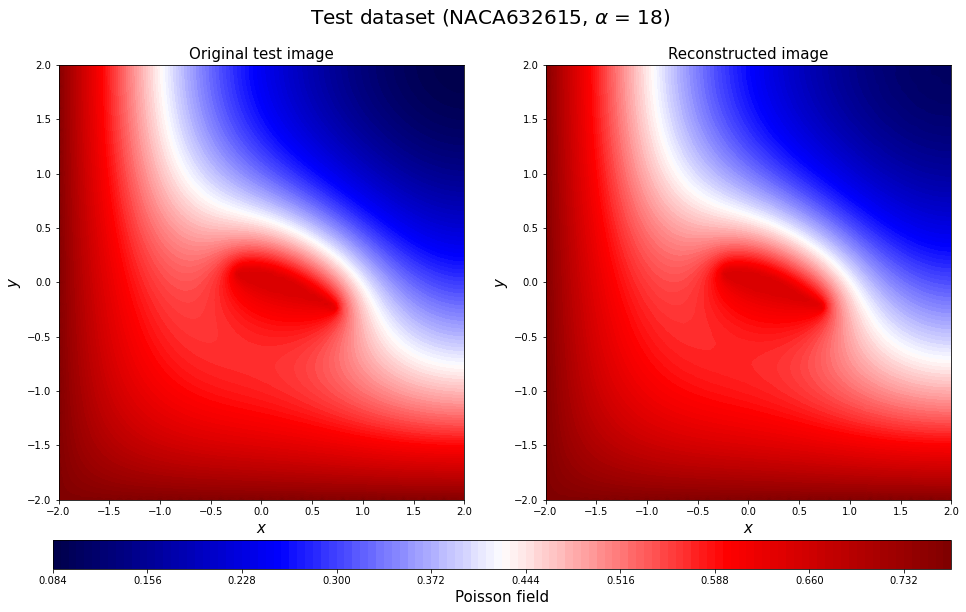

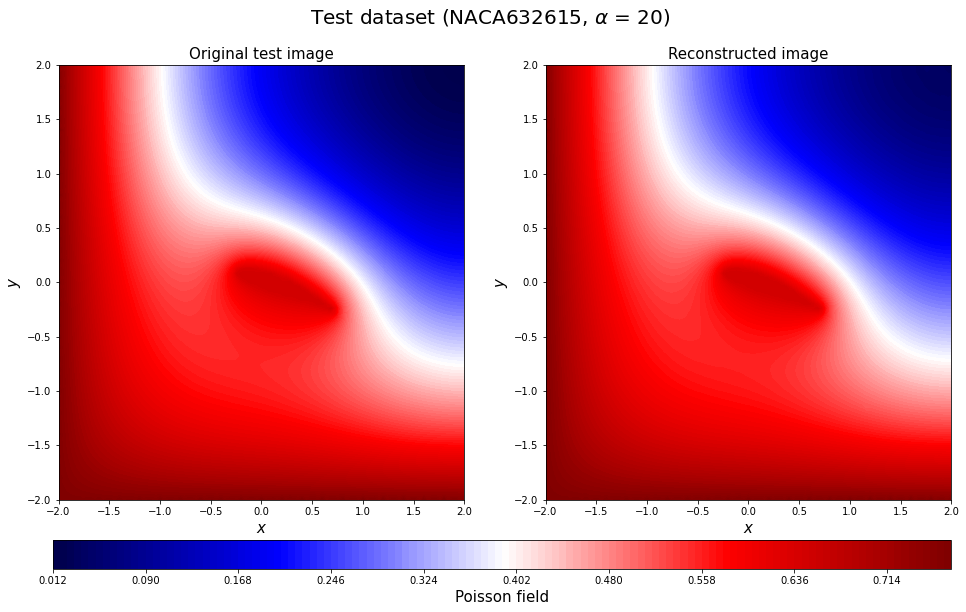

In [228]:
for c in range(96,112):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                      vmax = np.max(y_test0_rotate),levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                      vmax = np.max(y_test0_rotate),levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221029Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

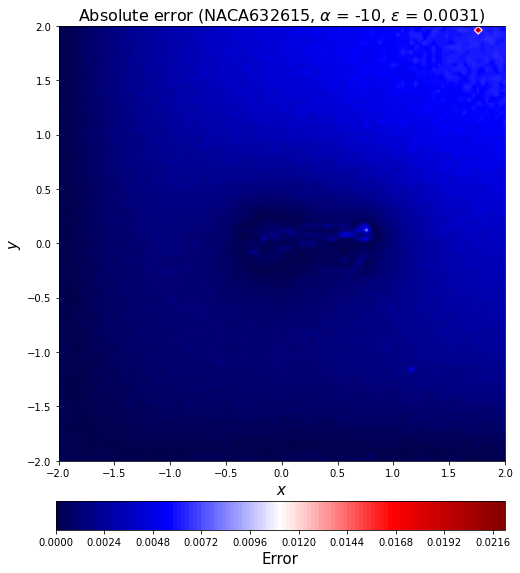

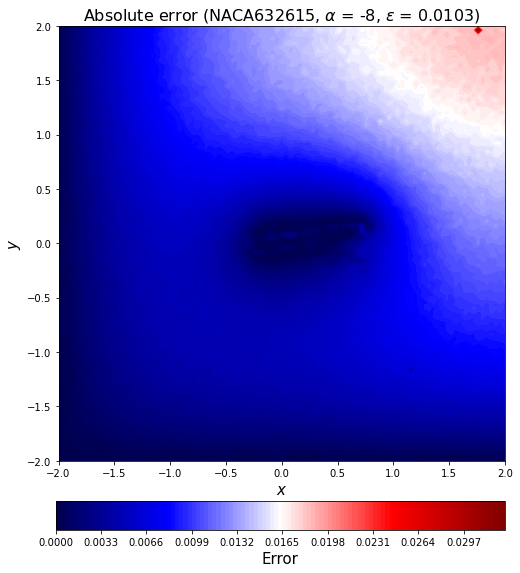

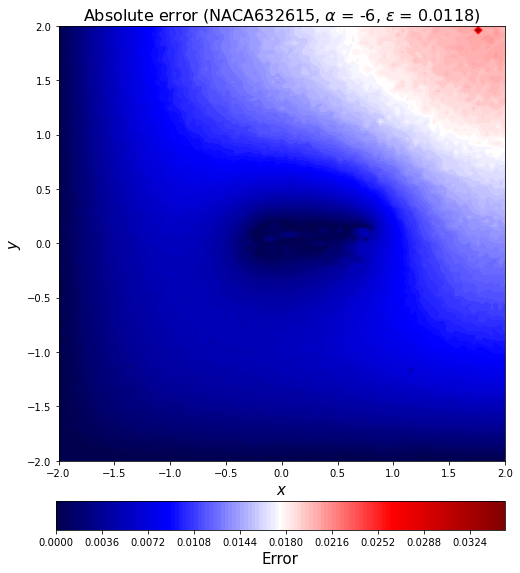

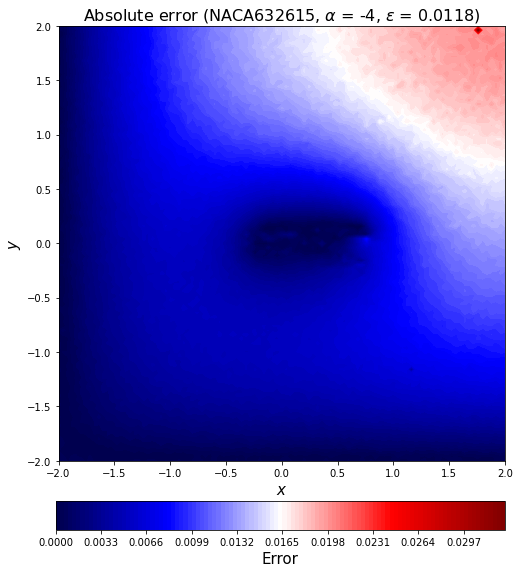

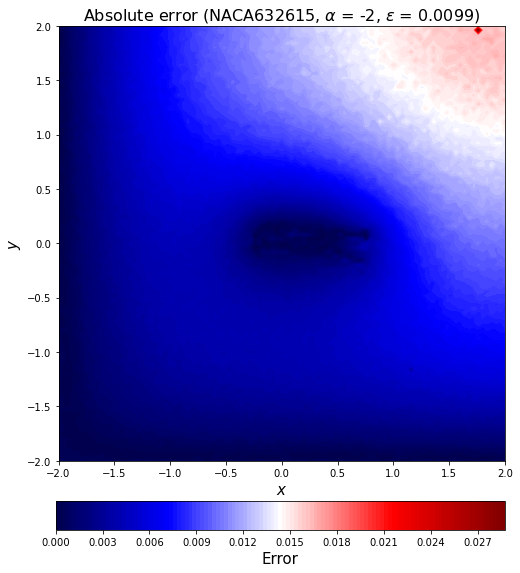

...

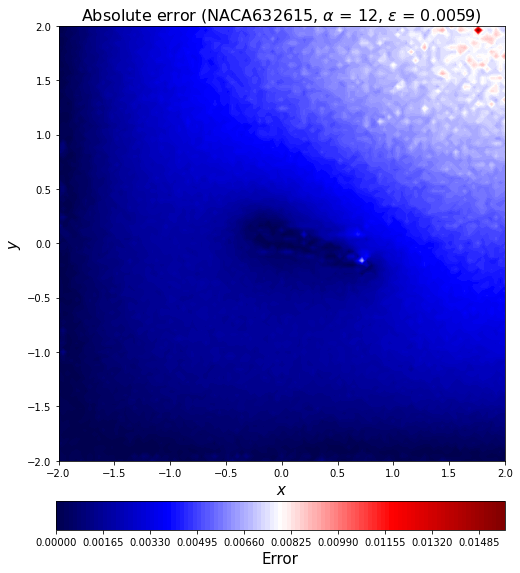

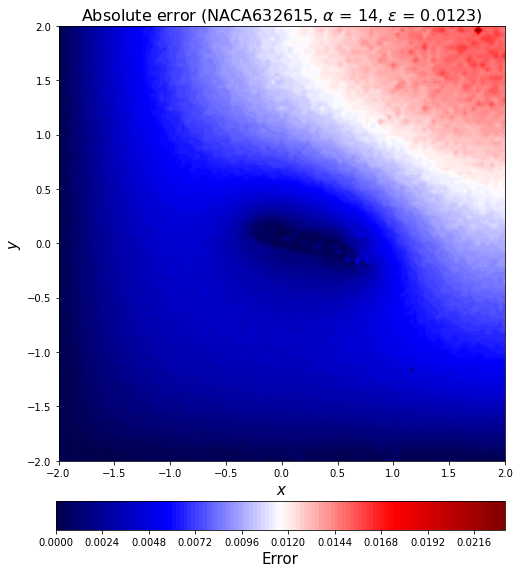

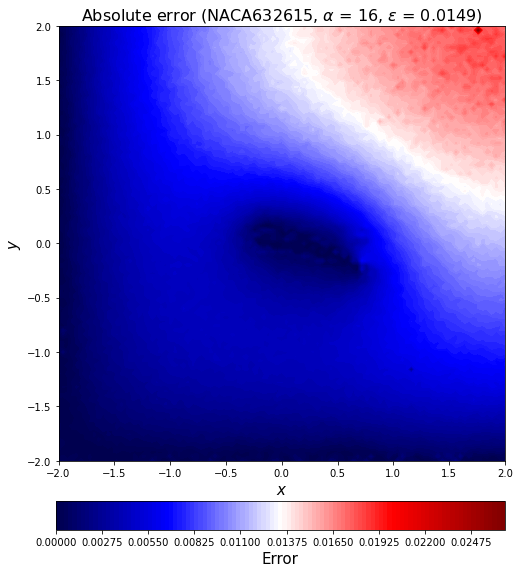

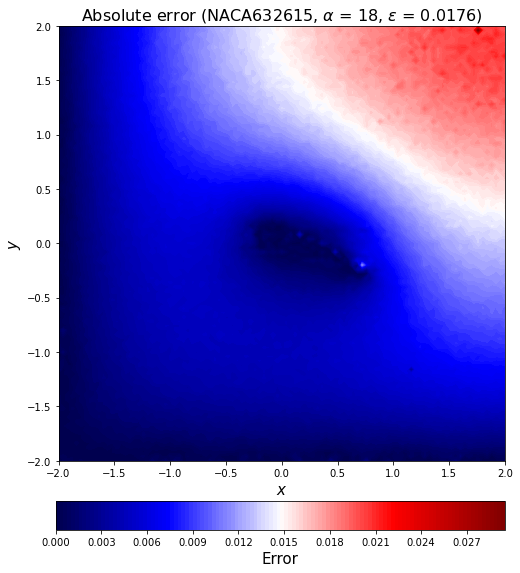

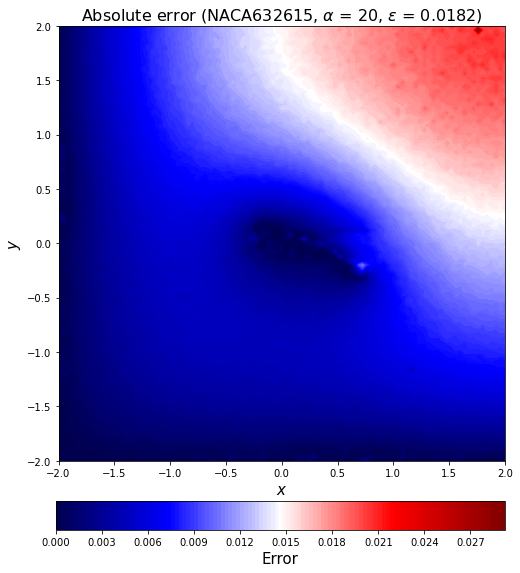

In [229]:
for c in range(96,112):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221029PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()